In [132]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import pathlib
import seaborn as sns
import plotly.express as px
import os
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor , ExtraTreesRegressor
from sklearn.model_selection import train_test_split
import warnings

In [133]:
print(Path.cwd())
warnings.filterwarnings("ignore")
director = Path('/home/viniciusmonteiropina/Project_AIRBNB(Data_Science)')
arquieves =  director.iterdir()
for arquieve in arquieves:
    print(arquieve.name)

/home/viniciusmonteiropina/Project_AIRBNB(Data_Science)
map.html
dataset.zip
PROJECT.ipynb
Deploy.ipynb
first records.csv
dataset
Solução Airbnb Rio.ipynb
.ipynb_checkpoints
primeiros_registros.csv


In [134]:
fist_recordings = pd.read_csv('primeiros_registros.csv')
fist_recordings.head()

,Unnamed: 0,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,ano,mes
0,0,17878,https://www.airbnb.com/rooms/17878,20191223164813,2019-12-24,Very Nice 2Br - Copacabana - WiFi,Pls note that special rates apply for Carnival...,- large balcony which looks out on pedestrian ...,Pls note that special rates apply for Carnival...,none,This is the best spot in Rio. Everything happe...,NaN,Excellent location. Close to all major public ...,The entire apartment is yours. It's like your ...,I will be available throughout your stay shoul...,Please leave the apartment in a clean fashion ...,NaN,NaN,https://a0.muscache.com/im/pictures/65320518/3...,NaN,68997,https://www.airbnb.com/users/show/68997,Matthias,2010-01-08,"Rio de Janeiro, State of Rio de Janeiro, Brazil",I am a journalist/writer. Lived for 15 years...,within an hour,100%,NaN,t,https://a0.muscache.com/im/pictures/user/67b13...,https://a0.muscache.com/im/pictures/user/67b13...,Copacabana,2.0,2.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Rio de Janeiro, Rio de Janeiro, Brazil",Copacabana,Copacabana,NaN,Rio de Janeiro,Rio de Janeiro,22020-050,Rio De Janeiro,"Rio de Janeiro, Brazil",BR,Brazil,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,$323.00,NaN,NaN,$0.00,$368.00,2,$61.00,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,t,3,9,17,292,2019-12-24,246,28.0,2010-07-15,2019-12-22,93.0,10.0,10.0,10.0,10.0,10.0,9.0,f,NaN,NaN,t,f,strict_14_with_grace_period,f,f,1,1.0,0.0,0.0,2.14,2019,12
1,1,25026,https://www.airbnb.com/rooms/25026,20191223164813,2019-12-24,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,"For any stay superior to 15 days, an additiona...",At night we recommend you to take taxis only. ...,"internet wi-fi, cable tv, air cond, ceiling fa...","Only at check in, we like to leave our guests ...",Smoking outside only. Family building so pleas...,NaN,NaN,https://a0.muscache.com/im/pictures/3003965/68...,NaN,102840,https://www.airbnb.com/users/show/102840,Viviane,2010-04-03,"Rio de Janeiro, State of Rio de Janeiro, Brazil","Hi guy

In [135]:
folder_data = pathlib .Path('dataset')
months = {
    'jan': 1,
    'fev': 2,
    'mar': 3,
    'abr': 4,
    'mai': 5,
    'jun': 6,
    'jul': 7,
    'ago': 8,
    'set': 9,
    'out': 10,
    'nov': 11,
    'dez': 12
}
datasets = []
for arqv in folder_data.iterdir():
    month_name = arqv.name[:3]
    month = months[month_name]
    year =  arqv.name[-8:]
    year = int(year.replace('.csv', ''))
    df = pd.read_csv(folder_data / arqv.name)
    df['year'] =  year
    df['month'] = month
    datasets.append(df)
    #display(datasets)

In [136]:
display(datasets)

[             id                            listing_url       scrape_id  \
 0         17878     https://www.airbnb.com/rooms/17878  20191223164813   
 1         25026     https://www.airbnb.com/rooms/25026  20191223164813   
 2         31560     https://www.airbnb.com/rooms/31560  20191223164813   
 3         35636     https://www.airbnb.com/rooms/35636  20191223164813   
 4         35764     https://www.airbnb.com/rooms/35764  20191223164813   
 ...         ...                                    ...             ...   
 34546  41018667  https://www.airbnb.com/rooms/41018667  20191223164813   
 34547  41020158  https://www.airbnb.com/rooms/41020158  20191223164813   
 34548  41020267  https://www.airbnb.com/rooms/41020267  20191223164813   
 34549  41021495  https://www.airbnb.com/rooms/41021495  20191223164813   
 34550  41022176  https://www.airbnb.com/rooms/41022176  20191223164813   
 
       last_scraped                                             name  \
 0       2019-12-24       

In [137]:
data_airbnb = pd.concat(datasets) # mixing the datasets
display(data_airbnb.head())

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,year,month
0,17878,https://www.airbnb.com/rooms/17878,20191223164813,2019-12-24,Very Nice 2Br - Copacabana - WiFi,Pls note that special rates apply for Carnival...,- large balcony which looks out on pedestrian ...,Pls note that special rates apply for Carnival...,none,This is the best spot in Rio. Everything happe...,NaN,Excellent location. Close to all major public ...,The entire apartment is yours. It's like your ...,I will be available throughout your stay shoul...,Please leave the apartment in a clean fashion ...,NaN,NaN,https://a0.muscache.com/im/pictures/65320518/3...,NaN,68997,https://www.airbnb.com/users/show/68997,Matthias,2010-01-08,"Rio de Janeiro, State of Rio de Janeiro, Brazil",I am a journalist/writer. Lived for 15 years...,within an hour,100%,NaN,t,https://a0.muscache.com/im/pictures/user/67b13...,https://a0.muscache.com/im/pictures/user/67b13...,Copacabana,2.0,2.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Rio de Janeiro, Rio de Janeiro, Brazil",Copacabana,Copacabana,NaN,Rio de Janeiro,Rio de Janeiro,22020-050,Rio De Janeiro,"Rio de Janeiro, Brazil",BR,Brazil,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,$323.00,NaN,NaN,$0.00,$368.00,2,$61.00,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,t,3,9,17,292,2019-12-24,246,28.0,2010-07-15,2019-12-22,93.0,10.0,10.0,10.0,10.0,10.0,9.0,f,NaN,NaN,t,f,strict_14_with_grace_period,f,f,1,1.0,0.0,0.0,2.14,2019,12
1,25026,https://www.airbnb.com/rooms/25026,20191223164813,2019-12-24,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,"For any stay superior to 15 days, an additiona...",At night we recommend you to take taxis only. ...,"internet wi-fi, cable tv, air cond, ceiling fa...","Only at check in, we like to leave our guests ...",Smoking outside only. Family building so pleas...,NaN,NaN,https://a0.muscache.com/im/pictures/3003965/68...,NaN,102840,https://www.airbnb.com/users/show/102840,Viviane,2010-04-03,"Rio de Janeiro, State of Rio de Janeiro, Brazil","Hi guys, We're a l

In [138]:
print(data_airbnb.columns)

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       ...
       'cancellation_policy', 'require_guest_profile_picture',
       'require_guest_phone_verification', 'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month',
       'year', 'month'],
      dtype='object', length=108)


In [139]:
categoric_columns = data_airbnb.select_dtypes(include='number').columns
numeric_columns = data_airbnb.select_dtypes(exclude='number').columns
print(categoric_columns)
print('-'*50)
print(numeric_columns)

Index(['id', 'scrape_id', 'thumbnail_url', 'medium_url', 'xl_picture_url',
       'host_id', 'host_listings_count', 'host_total_listings_count',
       'neighbourhood_group_cleansed', 'latitude', 'longitude', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'square_feet', 'guests_included',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'number_of_reviews_ltm', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'jurisdiction_names',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_hos

In [140]:
print(list(data_airbnb.columns))

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price', '

In [141]:
print(list(data_airbnb.dtypes))

[dtype('int64'), dtype('O'), dtype('int64'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('float64'), dtype('float64'), dtype('O'), dtype('float64'), dtype('int64'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('float64'), dtype('float64'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('float64'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('float64'), dtype('float64'), dtype('O'), dtype('O'), dtype('O'), dtype('int64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('O'), dtype('O'), dtype('float64'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('O'), dtype('int64'), dtype('O'), dtype('int64'), dtype('int64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'),

In [142]:
columns = list(data_airbnb.columns)
dtypes = list(data_airbnb.dtypes)

# Combine them into a dictionary
columns_dict = {columns[i]: dtypes[i] for i in range(len(columns))}
columns_dict

{'id': dtype('int64'),
 'listing_url': dtype('O'),
 'scrape_id': dtype('int64'),
 'last_scraped': dtype('O'),
 'name': dtype('O'),
 'summary': dtype('O'),
 'space': dtype('O'),
 'description': dtype('O'),
 'experiences_offered': dtype('O'),
 'neighborhood_overview': dtype('O'),
 'notes': dtype('O'),
 'transit': dtype('O'),
 'access': dtype('O'),
 'interaction': dtype('O'),
 'house_rules': dtype('O'),
 'thumbnail_url': dtype('float64'),
 'medium_url': dtype('float64'),
 'picture_url': dtype('O'),
 'xl_picture_url': dtype('float64'),
 'host_id': dtype('int64'),
 'host_url': dtype('O'),
 'host_name': dtype('O'),
 'host_since': dtype('O'),
 'host_location': dtype('O'),
 'host_about': dtype('O'),
 'host_response_time': dtype('O'),
 'host_response_rate': dtype('O'),
 'host_acceptance_rate': dtype('O'),
 'host_is_superhost': dtype('O'),
 'host_thumbnail_url': dtype('O'),
 'host_picture_url': dtype('O'),
 'host_neighbourhood': dtype('O'),
 'host_listings_count': dtype('float64'),
 'host_total_

In [143]:
data_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 902210 entries, 0 to 39470
Columns: 108 entries, id to month
dtypes: float64(31), int64(15), object(62)
memory usage: 750.3+ MB


In [144]:
data_airbnb.shape

(902210, 108)

In [145]:
#ctrl s seleciona as coisas que vc quiser
data_airbnb = data_airbnb.drop(['id','listing_url','last_scraped','scrape_id','name','summary','space'],axis=1)
data_airbnb = data_airbnb.drop(['experiences_offered','neighborhood_overview','notes','transit','access','interaction','house_rules','thumbnail_url'],axis=1)
data_airbnb = data_airbnb.drop(['medium_url','picture_url','xl_picture_url','host_id','host_url','host_name','host_since','host_location'],axis=1)
data_airbnb = data_airbnb.drop(['host_about','host_thumbnail_url','host_picture_url','host_acceptance_rate','host_neighbourhood','host_total_listings_count','host_verifications'],axis=1)
data_airbnb = data_airbnb.drop(['host_has_profile_pic','street','neighbourhood','city','state','zipcode','market','smart_location'],axis=1)
data_airbnb = data_airbnb.drop(['country_code','country','has_availability','availability_30','availability_60','availability_90','calendar_last_scraped','first_review'],axis=1)
data_airbnb = data_airbnb.drop(['jurisdiction_names','license','requires_license','require_guest_profile_picture','require_guest_phone_verification','calculated_host_listings_count_shared_rooms'],axis=1)
data_airbnb = data_airbnb.drop(['is_business_travel_ready','host_is_superhost'],axis=1)

In [146]:
data_airbnb.columns

Index(['description', 'host_response_time', 'host_response_rate',
       'host_listings_count', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'is_location_exact', 'property_type', 'room_type',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type',
       'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price',
       'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_updated', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'last_review',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location

In [147]:
data_airbnb.shape

(902210, 54)

In [148]:
print(data_airbnb.shape[0])

902210


In [149]:
data_airbnb.loc[data_airbnb.neighbourhood_group_cleansed.isnull()]

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,reviews_per_month,year,month
0,Pls note that special rates apply for Carnival...,within an hour,100%,2.0,t,Copacabana,NaN,-22.965920,-43.178960,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,$323.00,NaN,NaN,$0.00,$368.00,2,$61.00,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,292,246,28.0,2019-12-22,93.0,10.0,10.0,10.0,10.0,10.0,9.0,t,strict_14_with_grace_period,1,1.0,0.0,2.14,2019,12
1,"Our apartment is a little gem, everyone loves ...",within a day,91%,3.0,t,Copacabana,NaN,-22.977120,-43.190450,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,$159.00,NaN,NaN,"$1,000.00",$250.00,2,$45.00,7,60,7.0,7.0,60.0,60.0,7.0,60.0,2 months ago,133,236,16.0,2019-11-29,94.0,9.0,10.0,9.0,10.0,10.0,9.0,f,strict_14_with_grace_period,3,3.0,0.0,2.03,2019,12
2,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,1.0,t,Ipanema,NaN,-22.983020,-43.214270,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,$266.00,NaN,NaN,$0.00,$82.00,2,$41.00,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,a week ago,115,274,40.0,2019-12-10,96.0,10.0,10.0,10.0,10.0,10.0,10.0,t,strict_14_with_grace_period,1,1.0,0.0,2.38,2019,12
3,This cosy apartment is just a few steps away ...,within an hour,100%,1.0,t,Ipanema,NaN,-22.988160,-43.193590,t,Apartment,Entire home/apt,2,1.5,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,$368.00,NaN,"$9,406.00","$1,022.00",$168.00,2,$61.00,2,89,2.0,2.0,89.0,89.0,2.0,89.0,3 months ago,90,171,33.0,2019-12-06,94.0,10.0,9.0,10.0,10.0,10.0,9.0,f,strict_14_with_grace_period,1,1.0,0.0,2.27,2019,12
4,Our newly renovated studio is located in the b...,within an hour,100%,1.0,t,Copacabana,NaN,-22.981270,-43.190460,t,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",0.0,$131.00,"$1,500.00",NaN,$400.00,$140.00,2,$80.00,3,28,3.0,3.0,28.0,28.0,3.0,28.0,5 weeks ago,141,320,41.0,2019-12-15,98.0,10.0,10.0,10.0,10.0,10.0,10.0,f,strict_14_with_grace_period,1,1.0,0.0,2.85,2019,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39466,This luxury Rio apartment is located 50 meter...,NaN,NaN,5.0,t,Copacabana,NaN,-22.981855,-43.189439,f,Apartment,Entire home/apt,5,3.0,2.0,4.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",1615.0,$523.00,NaN,NaN,NaN,$392.00,4,$0.00,7,60,NaN,NaN,NaN,NaN,NaN,NaN,2 days ago,85,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,strict_14_with_grace_period,3,NaN,NaN,NaN,2018,5
39467,Momentos inesquecíveis você só concegue no bel...,within a day,71%,17.0,f,Barra da Tijuca,NaN,-22.982703,-43.403362,t,Casa particular (Cuba),Entire home/apt,4,1.0,0.0,1.0,Real Bed,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",NaN,"$1,500.00",NaN,NaN,NaN,NaN,1,$0.00,1,1125,NaN,NaN,N

In [150]:
data_airbnb = data_airbnb.drop(['neighbourhood_group_cleansed'],axis=1)

In [151]:
data_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 902210 entries, 0 to 39470
Data columns (total 53 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   description                                   884040 non-null  object 
 1   host_response_time                            500367 non-null  object 
 2   host_response_rate                            500364 non-null  object 
 3   host_listings_count                           901750 non-null  float64
 4   host_identity_verified                        901750 non-null  object 
 5   neighbourhood_cleansed                        902210 non-null  object 
 6   latitude                                      902210 non-null  float64
 7   longitude                                     902210 non-null  float64
 8   is_location_exact                             902210 non-null  object 
 9   property_type                                 902210 n

In [152]:
data_airbnb.isnull().sum()

description                                      18170
host_response_time                              401843
host_response_rate                              401846
host_listings_count                                460
host_identity_verified                             460
neighbourhood_cleansed                               0
latitude                                             0
longitude                                            0
is_location_exact                                    0
property_type                                        0
room_type                                            0
accommodates                                         0
bathrooms                                         1724
bedrooms                                           850
beds                                              2502
bed_type                                             0
amenities                                            0
square_feet                                     888162
price     

In [153]:
total_rows = data_airbnb.shape[0]
print(f'reviews_per_month  missing values are in {round(424288*100/total_rows,1)}% of rows, and review_scores_accuracy missing values are in {round(888162*100/total_rows,1)}% of rows.')

reviews_per_month  missing values are in 47.0% of rows, and review_scores_accuracy missing values are in 98.4% of rows.


In [154]:
data_airbnb.shape

(902210, 53)

In [155]:
# Importe as bibliotecas necessárias
import pandas as pd

# Supondo que 'data_airbnb' seja o seu DataFrame

# Crie uma lista para armazenar o nome das colunas que devem ser removidas
columns_to_remove = []

# Itere sobre as colunas do DataFrame
for column in data_airbnb.columns:
    # Calcule a porcentagem de valores nulos na coluna atual
    null_percentage = round(data_airbnb[column].isnull().sum() * 100 / len(data_airbnb))
    print(null_percentage)
    if null_percentage > 45:
        # Adicione o nome da coluna à lista de colunas a serem removidas
        columns_to_remove.append(column)

# Remova as colunas do DataFrame
data_airbnb.drop(columns=columns_to_remove, inplace=True)

# Exiba o DataFrame após a remoção das colunas
display(data_airbnb)


2
45
45
0
0
0
0
0
0
0
0
0
0
0
0
0
0
98
0
92
91
47
35
0
0
0
0
33
33
33
33
33
33
0
0
0
33
47
50
50
50
50
50
50
50
0
0
0
33
33
47
0
0


,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month
0,Pls note that special rates apply for Carnival...,within an hour,100%,2.0,t,Copacabana,-22.965920,-43.178960,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$323.00,$368.00,2,$61.00,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,292,246,28.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12
1,"Our apartment is a little gem, everyone loves ...",within a day,91%,3.0,t,Copacabana,-22.977120,-43.190450,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$159.00,$250.00,2,$45.00,7,60,7.0,7.0,60.0,60.0,7.0,60.0,2 months ago,133,236,16.0,f,strict_14_with_grace_period,3,3.0,0.0,2019,12
2,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,1.0,t,Ipanema,-22.983020,-43.214270,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$266.00,$82.00,2,$41.00,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,a week ago,115,274,40.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12
3,This cosy apartment is just a few steps away ...,within an hour,100%,1.0,t,Ipanema,-22.988160,-43.193590,t,Apartment,Entire home/apt,2,1.5,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$368.00,$168.00,2,$61.00,2,89,2.0,2.0,89.0,89.0,2.0,89.0,3 months ago,90,171,33.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12
4,Our newly renovated studio is located in the b...,within an hour,100%,1.0,t,Copacabana,-22.981270,-43.190460,t,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",$131.00,$140.00,2,$80.00,3,28,3.0,3.0,28.0,28.0,3.0,28.0,5 weeks ago,141,320,41.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39466,This luxury Rio apartment is located 50 meter...,NaN,NaN,5.0,t,Copacabana,-22.981855,-43.189439,f,Apartment,Entire home/apt,5,3.0,2.0,4.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$523.00,$392.00,4,$0.00,7,60,NaN,NaN,NaN,NaN,NaN,NaN,2 days ago,85,0,NaN,f,strict_14_with_grace_period,3,NaN,NaN,2018,5
39467,Momentos inesquecíveis você só concegue no bel...,within a day,71%,17.0,f,Barra da Tijuca,-22.982703,-43.403362,t,Casa particular (Cuba),Entire home/apt,4,1.0,0.0,1.0,Real Bed,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...","$1,500.00",NaN,1,$0.00,1,1125,NaN,NaN,NaN,NaN,NaN,NaN,yesterday,364,0,NaN,f,flexible,15,NaN,NaN,2018,5
39468,Apartamento muito simples mais com utensílios ...,within an hour,100%,4.0,f,Copacabana,-22.975042,-43.189856,t,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Smoking a...",$110.00,NaN,1,$0.00,2,25,NaN,NaN,NaN,NaN,NaN,NaN,yesterday,365,0,NaN,t,flexible,4,NaN,NaN,2018,5
39469,"Apartamento Lindo em Copacabana, fica a 100 me...",NaN,NaN,1.0,f,Copacabana,-22.983718,-43.190023,t,Apartment,Entire home/apt,6,1.0,0.0,4.0,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets allo...",$254.00,NaN,1,$0.00,2,30,NaN,NaN,NaN,NaN,NaN,NaN,yesterday,359,0,NaN,t,flexible,1,NaN,NaN,2018,5


In [156]:
data_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 902210 entries, 0 to 39470
Data columns (total 40 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   description                                   884040 non-null  object 
 1   host_response_time                            500367 non-null  object 
 2   host_response_rate                            500364 non-null  object 
 3   host_listings_count                           901750 non-null  float64
 4   host_identity_verified                        901750 non-null  object 
 5   neighbourhood_cleansed                        902210 non-null  object 
 6   latitude                                      902210 non-null  float64
 7   longitude                                     902210 non-null  float64
 8   is_location_exact                             902210 non-null  object 
 9   property_type                                 902210 n

In [157]:
data_airbnb.dropna(inplace=True)

In [158]:
display(data_airbnb)

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month
0,Pls note that special rates apply for Carnival...,within an hour,100%,2.0,t,Copacabana,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$323.00,$368.00,2,$61.00,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,292,246,28.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12
1,"Our apartment is a little gem, everyone loves ...",within a day,91%,3.0,t,Copacabana,-22.97712,-43.19045,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$159.00,$250.00,2,$45.00,7,60,7.0,7.0,60.0,60.0,7.0,60.0,2 months ago,133,236,16.0,f,strict_14_with_grace_period,3,3.0,0.0,2019,12
2,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,1.0,t,Ipanema,-22.98302,-43.21427,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$266.00,$82.00,2,$41.00,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,a week ago,115,274,40.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12
3,This cosy apartment is just a few steps away ...,within an hour,100%,1.0,t,Ipanema,-22.98816,-43.19359,t,Apartment,Entire home/apt,2,1.5,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$368.00,$168.00,2,$61.00,2,89,2.0,2.0,89.0,89.0,2.0,89.0,3 months ago,90,171,33.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12
4,Our newly renovated studio is located in the b...,within an hour,100%,1.0,t,Copacabana,-22.98127,-43.19046,t,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",$131.00,$140.00,2,$80.00,3,28,3.0,3.0,28.0,28.0,3.0,28.0,5 weeks ago,141,320,41.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34945,Excellent apartment located less than 2 km fro...,within an hour,100%,60.0,f,Jacarepaguá,-22.97038,-43.39403,t,Apartment,Entire home/apt,3,2.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$250.00,$200.00,2,$30.00,1,1125,1.0,5.0,90.0,1125.0,1.8,493.8,today,191,0,0.0,t,strict_14_with_grace_period,47,47.0,0.0,2019,8
34950,Apartamento aconchegante com vista montanha no...,within an hour,100%,18.0,t,Recreio dos Bandeirantes,-23.02270,-43.51394,t,Condominium,Entire home/apt,5,2.0,2.0,4.0,Real Bed,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",$342.00,$200.00,1,$20.00,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,today,299,0,0.0,f,moderate,16,13.0,3.0,2019,8
34960,O espaço perfeito na MELHOR localização conhec...,within an hour,100%,2.0,t,Copacabana,-22.98380,-43.19093,t,Apartment,Entire home/apt,4,1.0,1.0,2.0,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets allo...",$139.00,$112.00,1,$0.00,2,1125,2.0,4.0,1125.0,1125.0,2.1,1125.0,today,161,0,0.0,t,flexible,2,2.0,0.0,2019,8
34966,Esse FANTÁSTICO ESPAÇO para até 4 pessoas está...,within an hour,100%,64.0,t,Leblon,-22.98466,-43.22094,t,House,Entire home/apt,4,2.0,2.0,3.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$684.00,$160.00,4,$0.00,1,1125,2.0,2.0,89.0,89.0,2.0,89.0,today,166,0,0.0,t,super_strict_30,37,34.0,3.0,2019,8


In [159]:
902210 - 271483

630727

In [160]:
data_airbnb.isnull().sum()

description                                     0
host_response_time                              0
host_response_rate                              0
host_listings_count                             0
host_identity_verified                          0
neighbourhood_cleansed                          0
latitude                                        0
longitude                                       0
is_location_exact                               0
property_type                                   0
room_type                                       0
accommodates                                    0
bathrooms                                       0
bedrooms                                        0
beds                                            0
bed_type                                        0
amenities                                       0
price                                           0
cleaning_fee                                    0
guests_included                                 0


In [161]:
print(data_airbnb.dtypes)
print('-'*90)
print(data_airbnb.iloc[0])

description                                      object
host_response_time                               object
host_response_rate                               object
host_listings_count                             float64
host_identity_verified                           object
neighbourhood_cleansed                           object
latitude                                        float64
longitude                                       float64
is_location_exact                                object
property_type                                    object
room_type                                        object
accommodates                                      int64
bathrooms                                       float64
bedrooms                                        float64
beds                                            float64
bed_type                                         object
amenities                                        object
price                                           

In [162]:
#price   $323.00 tem um cifrao e virgula por isso ta sendo reconhecido como objeto, deve ser tratado por esse problema  
data_airbnb['price']  = data_airbnb['price'].str.replace('$','')
data_airbnb['price']  = data_airbnb['price'].str.replace(',','')
data_airbnb['price']  = data_airbnb['price'].astype(np.float32,copy=False)

#extra people
data_airbnb['extra_people']  = data_airbnb['extra_people'].str.replace('$','')
data_airbnb['extra_people']  = data_airbnb['extra_people'].str.replace(',','')
data_airbnb['extra_people']  = data_airbnb['extra_people'].astype(np.float32,copy=False)
data_airbnb['extra_people'] = data_airbnb['extra_people'].astype(np.int16, copy=False)

#cleaning_fee
data_airbnb['cleaning_fee']  = data_airbnb['cleaning_fee'].str.replace('$','')
data_airbnb['cleaning_fee']  = data_airbnb['cleaning_fee'].str.replace(',','')
data_airbnb['cleaning_fee']  = data_airbnb['cleaning_fee'].astype(np.float32,copy=False)



#host_listings_count
data_airbnb['host_listings_count'] = data_airbnb['host_listings_count'].astype(np.float32, copy=False)
data_airbnb['host_listings_count'] = data_airbnb['host_listings_count'].astype(np.int16, copy=False)

#accommodates
data_airbnb['accommodates'] = data_airbnb['accommodates'].astype(np.int16, copy=False)


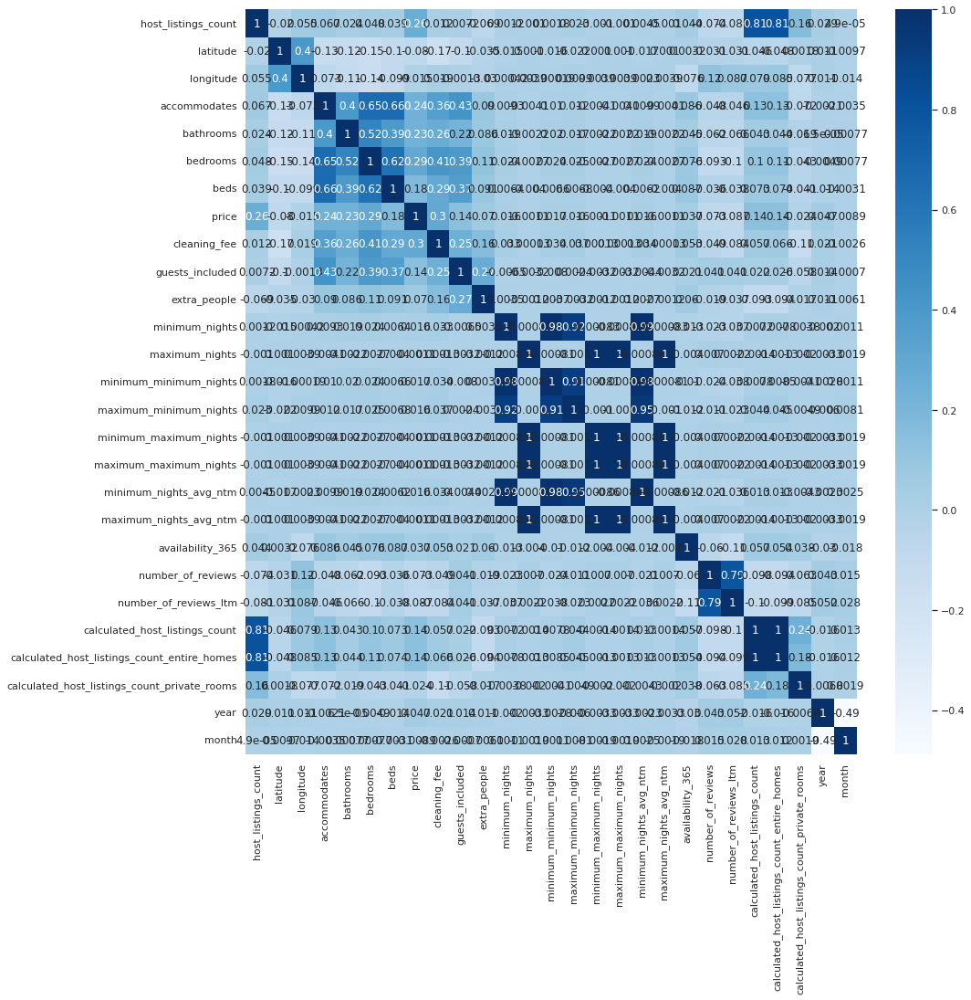

In [163]:
plt.figure(figsize=(15,15))
sns.heatmap(data_airbnb.corr(numeric_only=True),annot=True,cmap='Blues');


In [164]:
numeric_data =  data_airbnb.select_dtypes(exclude='object')

In [165]:
#sns.heatmap(data_airbnb.corr(numeric_only=True),annot=True,cmap='Blues');

numeric_data.corr().style.background_gradient(cmap='Blues')

,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,number_of_reviews_ltm,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month
host_listings_count,1.000000,-0.019606,0.055299,0.066867,0.023886,0.047780,0.038823,0.256343,0.011981,0.007209,-0.069471,0.001194,-0.001008,0.001843,0.022852,-0.001012,-0.001012,0.004455,-0.001012,0.043874,-0.074048,-0.080938,0.806702,0.807524,0.160395,0.028558,0.000049
latitude,-0.019606,1.000000,0.399415,-0.126601,-0.115672,-0.154313,-0.099865,-0.080052,-0.173660,-0.099927,-0.034960,-0.014827,0.000997,-0.016468,-0.022000,0.001000,0.000999,-0.016548,0.001000,0.003229,-0.030535,-0.031328,-0.046356,-0.048164,0.001829,0.010545,-0.009747
longitude,0.055299,0.399415,1.000000,-0.073455,-0.105627,-0.141808,-0.099394,-0.015229,0.018572,-0.001315,-0.029761,0.000421,0.003872,-0.000185,0.009876,0.003870,0.003871,0.002326,0.003870,-0.076150,0.118733,0.086930,0.079391,0.085107,-0.077183,0.010973,-0.013832
accommodates,0.066867,-0.126601,-0.073455,1.000000,0.396893,0.651842,0.657397,0.236610,0.357546,0.425126,0.090282,0.009327,-0.004095,0.009952,0.012332,-0.004098,-0.004098,0.009892,-0.004098,0.085676,-0.048082,-0.045803,0.128342,0.133465,-0.072389,-0.002083,-0.003535
bathrooms,0.023886,-0.115672,-0.105627,0.396893,1.000000,0.519279,0.391402,0.231038,0.264477,0.219674,0.085584,0.019474,-0.002166,0.020272,0.017336,-0.002168,-0.002168,0.019297,-0.002168,0.044906,-0.061626,-0.066299,0.042734,0.043924,-0.019106,0.000065,0.000768
bedrooms,0.047780,-0.154313,-0.141808,0.651842,0.519279,1.000000,0.623596,0.294074,0.413567,0.392471,0.112863,0.023594,-0.002742,0.024285,0.025161,-0.002745,-0.002744,0.024072,-0.002745,0.076044,-0.093388,-0.101345,0.103710,0.109054,-0.043284,-0.004872,0.000774
beds,0.038823,-0.099865,-0.099394,0.657397,0.391402,0.623596,1.000000,0.178270,0.287235,0.370848,0.091245,0.006374,-0.003997,0.006567,0.006807,-0.003999,-0.003999,0.006218,-0.003999,0.087301,-0.036375,-0.037534,0.073491,0.074162,-0.041108,-0.013982,-0.003116
price,0.256343,-0.080052,-0.015229,0.236610,0.231038,0.294074,0.178270,1.000000,0.296306,0.140402,0.069784,0.015944,-0.001128,0.016625,0.016033,-0.001132,-0.001131,0.015960,-0.001131,0.036850,-0.072823,-0.086793,0.136387,0.139451,-0.023736,0.047181,-0.008868
cleaning_fee,0.011981,-0.173660,0.018572,0.357546,0.264477,0.413567,0.287235,0.296306,1.000000,0.245248,0.157022,0.033220,0.000130,0.033547,0.037476,0.000128,0.000128,0.033978,0.000128,0.053462,-0.048839,-0.083646,0.056798,0.065778,-0.113747,0.021235,-0.002645
guests_included,0.007209,-0.099927,-0.001315,0.425126,0.219674,0.392471,0.370848,0.140402,0.245248,1.000000,0.271921,-0.006534,-0.003190,-0.008005,0.002407,-0.003196,-0.003195,-0.004414,-0.003196,0.020988,0.041345,0.040938,0.022137,0.025836,-0.058179,0.013891,-0.000702


In [166]:
def limits(columns):
    Q1 = columns.quantile(0.25) #quantile = quartil
    Q3 =  columns.quantile(0.75)
    amplitude = Q3- Q1
    inferior_limit = Q1 - 1.5 * amplitude
    superior_limit =  Q3 + 1.5 * amplitude
    return inferior_limit,superior_limit

limits(data_airbnb.price)  


def boxplot(coluna):
    fig,(ax1,ax2) = plt.subplots(1,2)
    fig.set_size_inches(15,5)
    sns.boxplot(x=coluna,ax=ax1)
    ax2.set_xlim(limits(coluna))
    sns.boxplot(x=coluna,ax=ax2)
    return



In [167]:
data_airbnb.bathrooms.describe()  #impossible to have 200 bathrooms

count    271483.000000
mean          1.653354
std           1.480868
min           0.000000
25%           1.000000
50%           1.000000
75%           2.000000
max         200.000000
Name: bathrooms, dtype: float64

In [168]:
data_airbnb.loc[data_airbnb.bathrooms == 200,'bathrooms']

29957    200.0
32914    200.0
28241    200.0
29051    200.0
28612    200.0
31545    200.0
30615    200.0
29219    200.0
Name: bathrooms, dtype: float64

In [169]:
# I'm going to assume this is a typo and swap 200 for 2
data_airbnb.loc[data_airbnb.bathrooms == 200,'bathrooms'] = 2

In [170]:
data_airbnb.loc[data_airbnb.bathrooms == 20].head()

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month
10120,BEAUTIFUL FLATS WITHthe nature NEAR. CLOSE to ...,within an hour,100%,11,f,Vargem Grande,-22.96659,-43.49366,f,Apartment,Private room,8,20.0,20.0,4.0,Real Bed,"{TV,""Cable TV"",Wifi,Pool,Kitchen,""Free parking...",70.0,120.0,1,50,1,90,1.0,1.0,90.0,90.0,1.0,90.0,22 months ago,364,4,1.0,f,flexible,10,5.0,5.0,2019,12
10430,BEAUTIFUL STUDIO ACCOMMODATES 15 PEOPLE in the...,within an hour,100%,11,f,Vargem Grande,-22.97061,-43.49485,f,Condominium,Entire home/apt,16,20.0,20.0,0.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Wheelchair acces...",37.0,120.0,1,50,1,265,1.0,1.0,265.0,265.0,1.0,265.0,22 months ago,365,6,2.0,f,flexible,10,5.0,5.0,2019,12
9633,BEAUTIFUL FLATS WITHthe nature NEAR. CLOSE to ...,within a few hours,100%,12,f,Vargem Grande,-22.96659,-43.49366,f,Apartment,Private room,8,20.0,20.0,4.0,Real Bed,"{TV,""Cable TV"",Wifi,Pool,Kitchen,""Free parking...",298.0,120.0,5,50,1,90,1.0,1.0,90.0,90.0,1.0,90.0,26 months ago,364,4,1.0,f,flexible,12,7.0,5.0,2020,4
9942,BEAUTIFUL STUDIO ACCOMMODATES 15 PEOPLE in the...,within a few hours,100%,12,f,Vargem Grande,-22.97061,-43.49485,f,Condominium,Entire home/apt,16,20.0,20.0,6.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Wheelchair acces...",298.0,120.0,5,50,1,265,1.0,1.0,265.0,265.0,1.0,265.0,26 months ago,364,6,1.0,f,flexible,12,7.0,5.0,2020,4
33394,"""Turtle House"", an imposing modern house overl...",within an hour,100%,7,t,Barra de Guaratiba,-23.06525,-43.56728,t,House,Entire home/apt,16,20.0,15.0,15.0,Real Bed,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",399.0,100.0,2,200,1,90,1.0,1.0,90.0,90.0,1.0,90.0,3 months ago,364,0,0.0,f,flexible,8,7.0,1.0,2020,4


In [171]:
data_airbnb.loc[(data_airbnb.bathrooms) == 20] = 2  # assuming the same logic

(-0.5, 3.5)


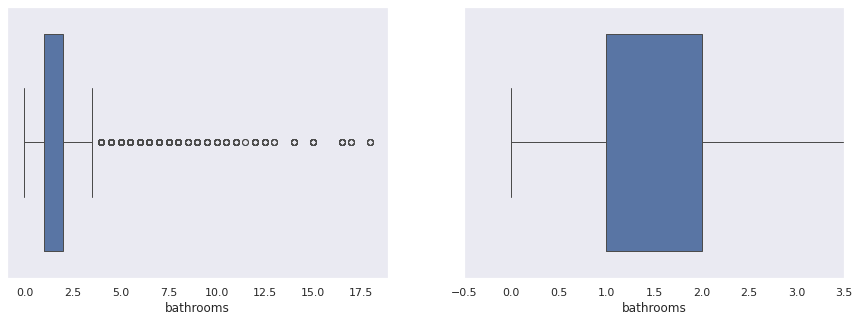

In [172]:
print(limits(data_airbnb.bathrooms))
boxplot(data_airbnb.bathrooms)

In [173]:
data_airbnb.loc[data_airbnb.bathrooms > 3.5].head()

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month
5,"Sunny terrace with side ocean view, 6 ensuite ...",within a few hours,96%,7,t,Ipanema,-22.98633,-43.20256,t,Apartment,Entire home/apt,13,7.0,6.0,6.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",3492.0,363.0,7,91,2,89,2.0,5.0,89.0,89.0,2.1,89.0,today,307,64,23.0,t,strict_14_with_grace_period,5,3.0,2.0,2019,12
10,"A cinematographyc Villa, with 4 suites facing ...",within a day,90%,4,f,Barra da Tijuca,-23.00307,-43.30911,f,House,Entire home/apt,12,7.0,4.0,7.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",2536.0,613.0,1,0,1,730,1.0,1.0,730.0,730.0,1.0,730.0,3 months ago,359,7,0.0,f,strict_14_with_grace_period,4,1.0,3.0,2019,12
25,"The apartment has 290m2, two suites plus two b...",within an hour,100%,1,f,Copacabana,-22.98119,-43.19373,f,Apartment,Entire home/apt,12,4.0,4.0,8.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",409.0,408.0,6,68,2,365,2.0,5.0,365.0,365.0,2.1,365.0,3 days ago,315,122,15.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12
61,"IN THE MIDDLE OF THE TIJUCA FOREST, THE SUITE...",within a few hours,100%,5,t,Itanhangá,-22.98789,-43.31698,t,Cottage,Private room,2,4.5,6.0,2.0,Real Bed,"{TV,Wifi,""Wheelchair accessible"",""Free parking...",180.0,30.0,1,80,2,30,2.0,2.0,30.0,30.0,2.0,30.0,2 months ago,262,2,2.0,t,moderate,6,0.0,6.0,2019,12
82,"If you already know Rio de Janeiro, the tradit...",a few days or more,0%,3,f,Praia da Bandeira,-22.80940,-43.18194,t,House,Private room,6,4.0,3.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",143.0,409.0,2,106,2,365,2.0,2.0,365.0,365.0,2.0,365.0,13 months ago,365,3,0.0,t,strict_14_with_grace_period,3,0.0,3.0,2019,12


# the collum bathroom has a variety of outliers. Bassicaly i'll delete all of them, because that can make the I.A model worst

In [174]:
def delete_outliers(data,column_name):
    total_lines = data.shape[0]
    inferior_limits,superior_limits = limits(df[column_name])
    data = data.loc[(data[column_name]>= inferior_limits) & (data[column_name] <=superior_limits),:]
    removed_lines = total_lines -  data.shape[0]
    return data, removed_lines

def limites(coluna):
    Q1 = coluna.quantile(0.25) #quantile = quartil
    Q3 =  coluna.quantile(0.75)
    amplitude = Q3- Q1
    limite_inferior = Q1 - 1.5 * amplitude
    limite_superiror =  Q3 + 1.5 * amplitude
    return limite_inferior,limite_superiror
    

def diagrama_caixa(coluna):
    fig,(ax1,ax2) = plt.subplots(1,2)
    fig.set_size_inches(15,5)
    sns.boxplot(x=coluna,ax=ax1)
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna,ax=ax2)
    return

def grafico_barra(coluna):
    plt.figure(figsize=(15,5))
    ax = sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts())
    ax.set_xlim(limites(coluna))
    return

def histplot(coluna):
    plt.figure(figsize=(15,5))
    sns.histplot(coluna)
    return



10110 deleted lines


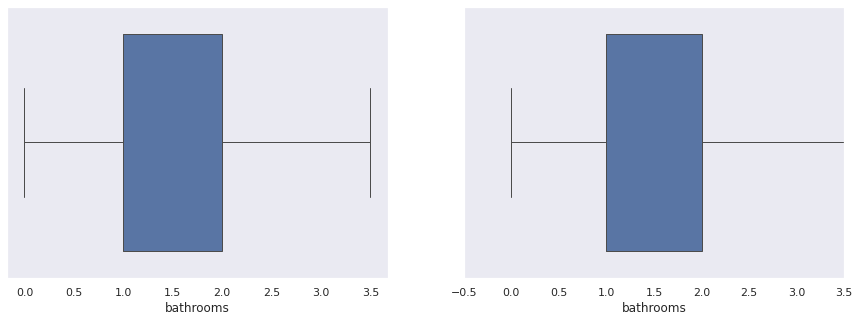

In [175]:
data_airbnb,removed_lines = delete_outliers(data_airbnb,'bathrooms')
print(f'{removed_lines} deleted lines')
boxplot(data_airbnb['bathrooms'])

In [176]:
data_airbnb.bathrooms.describe()

count    261373.000000
mean          1.510940
std           0.678469
min           0.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           3.500000
Name: bathrooms, dtype: float64

In [177]:
data_airbnb.bathrooms.value_counts()

bathrooms
1.0    145244
2.0     64572
1.5     18298
3.0     17058
2.5     10959
3.5      4099
0.0       811
0.5       332
Name: count, dtype: int64

In [178]:
# devo perceber de devo manter os valores que nao sao inteior tipo 1.5 + primeiro quartil /4 
# depois vejo o porque da equação!

In [179]:
data_airbnb.describe()

,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,number_of_reviews_ltm,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month
count,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,2.613730e+05,261373.000000,261373.000000,2.613730e+05,2.613730e+05,261373.000000,2.613730e+05,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000,261373.000000
mean,16.752587,-22.966879,-43.230287,4.158329,1.510940,1.521041,2.537879,384.078766,141.832840,2.078929,48.393453,3.405918,2.808303e+04,3.299641,4.169876,2.809511e+04,2.810448e+04,3.493875,2.809903e+04,211.936535,15.727007,5.726540,12.103561,11.073776,0.868406,2019.141124,5.417036
std,77.482156,0.225824,0.414183,2.189777,0.678469,0.902721,1.753569,994.122925,107.491913,1.667422,82.700346,13.717931,5.175630e+06,13.457987,14.885285,5.175630e+06,5.175630e+06,13.745660,5.175630e+06,131.586089,31.251377,9.700928,37.624829,37.154459,2.219334,18.087316,3.459557
min,0.000000,-23.072970,-43.706640,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000,1.000000
25%,1.000000,-22.984410,-43.228100,2.000000,1.000000,1.000000,1.000000,141.000000,80.000000,1.000000,0.000000,2.000000,4.000000e+01,2.000000,2.000000,6.000000e+01,6.000000e+01,2.000000,6.000000e+01,88.000000,1.000000,0.000000,1.000000,1.000000,0.000000,2019.000000,3.000000
50%,2.000000,-22.973960,-43.192960,4.000000,1.000000,1.000000,2.000000,221.000000,150.000000,1.000000,30.000000,2.000000,1.123000e+03,2.000000,3.000000,1.125000e+03,1.125000e+03,2.200000,1.125000e+03,220.000000,4.000000,2.000000,2.000000,1.000000,0.000000,2019.000000,5.000000
75%,6.000000,-22.961580,-43.185110,5.000000,2.000000,2.000000,3.000000,394.000000,180.000000,2.000000,67.000000,3.000000,1.125000e+03,3.000000,5.000000,1.125000e+03,1.125000e+03,3.100000,1.125000e+03,351.000000,15.000000,7.000000,5.000000,3.000000,1.000000,2020.000000,8.000000
max,1495.000000,2.000000,2.000000,64.000000,3.500000,20.000000,50.000000,57517.000000,2684.000000,16.000000,1659.000000,1000.000000,1.000000e+09,1000.000000,1000.000000,1.000000e+09,1.000000e+09,1000.000000,1.000000e+09,365.000000,401.000000,127.000000,324.000000,322.000000,40.000000,2020.000000,12.000000


In [180]:
data_airbnb.columns

Index(['description', 'host_response_time', 'host_response_rate',
       'host_listings_count', 'host_identity_verified',
       'neighbourhood_cleansed', 'latitude', 'longitude', 'is_location_exact',
       'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'bed_type', 'amenities', 'price', 'cleaning_fee',
       'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'instant_bookable', 'cancellation_policy',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms', 'year', 'month'],
      dtype='object')

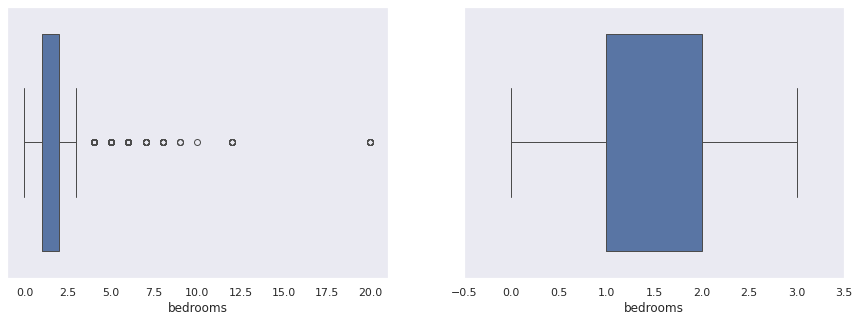

In [181]:
boxplot(data_airbnb.bedrooms)

In [182]:
data_airbnb.loc[(data_airbnb.bedrooms) == 20] = 2  # assuming the same logic

5979 deleted lines


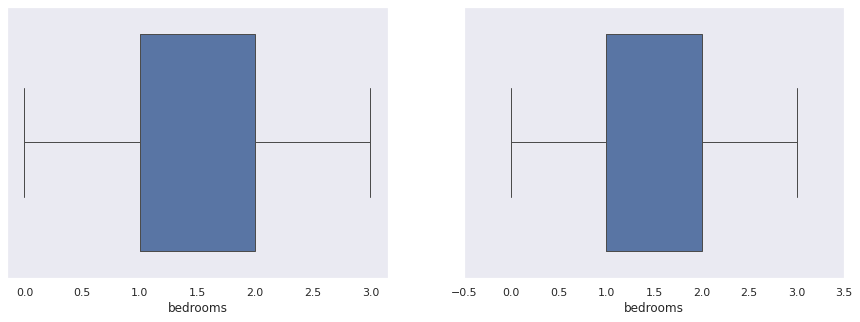

In [183]:
data_airbnb,removed_lines = delete_outliers(data_airbnb,'bedrooms')
print(f'{removed_lines} deleted lines')
boxplot(data_airbnb['bedrooms'])

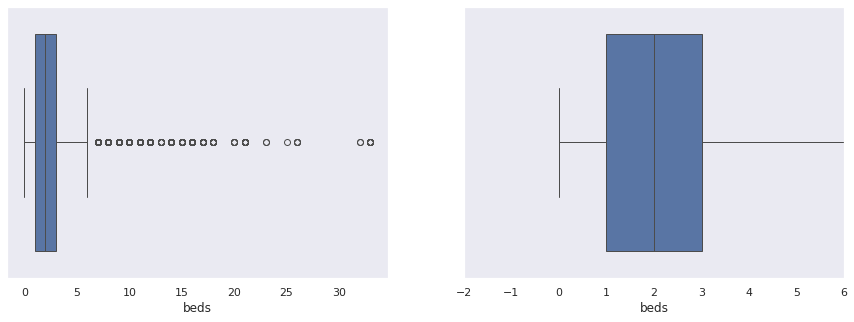

In [184]:
boxplot(data_airbnb['beds'])

In [185]:
beds_31 = data_airbnb.loc[data_airbnb.beds > 31]

In [186]:

# Configurar pandas para mostrar todas as colunas
pd.set_option('display.max_columns', None)

# Filtrar linhas onde o número de camas é maior que 31
beds_31 = data_airbnb.loc[data_airbnb.beds > 31]
display(beds_31.head())


,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month
22174,LINDOS FLATS JUNTO A NATUREZA PROXIMO AS PRAIA...,within an hour,100%,11,f,Vargem Grande,-22.96773,-43.49296,t,Apartment,Entire home/apt,16,3.0,0.0,33.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Pool,Ki...",70.0,120.0,1,50,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,24 months ago,365,2,2.0,f,flexible,10,5.0,5.0,2019,12
21132,LINDOS FLATS JUNTO A NATUREZA PROXIMO AS PRAIA...,within a few hours,100%,12,f,Vargem Grande,-22.96773,-43.49296,t,Apartment,Entire home/apt,16,3.0,0.0,33.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Pool,Ki...",298.0,120.0,1,50,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,28 months ago,364,2,2.0,f,flexible,12,7.0,5.0,2020,4
21590,LINDOS FLATS JUNTO A NATUREZA PROXIMO AS PRAIA...,within an hour,100%,12,f,Vargem Grande,-22.96773,-43.49296,t,Apartment,Entire home/apt,16,3.0,0.0,33.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Pool,Ki...",298.0,120.0,1,50,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,26 months ago,364,2,2.0,f,flexible,12,7.0,5.0,2020,2
21327,LINDOS FLATS JUNTO A NATUREZA PROXIMO AS PRAIA...,within an hour,100%,12,f,Vargem Grande,-22.96773,-43.49296,t,Apartment,Entire home/apt,16,3.0,0.0,33.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Pool,Ki...",299.0,120.0,1,50,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,26 months ago,364,2,2.0,f,flexible,12,7.0,5.0,2020,3
21083,LINDOS FLATS JUNTO A NATUREZA PROXIMO AS PRAIA...,within a few hours,100%,12,f,Vargem Grande,-22.96773,-43.49296,t,Apartment,Entire home/apt,16,3.0,0.0,33.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Pool,Ki...",302.0,120.0,1,50,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,29 months ago,364,2,1.0,f,flexible,12,7.0,5.0,2020,5


In [187]:
data_airbnb.loc[data_airbnb.beds >= 30,'beds'] = 3

In [188]:
data_airbnb.loc[data_airbnb.beds >= 20,'beds'] = 2

5393 deleted lines


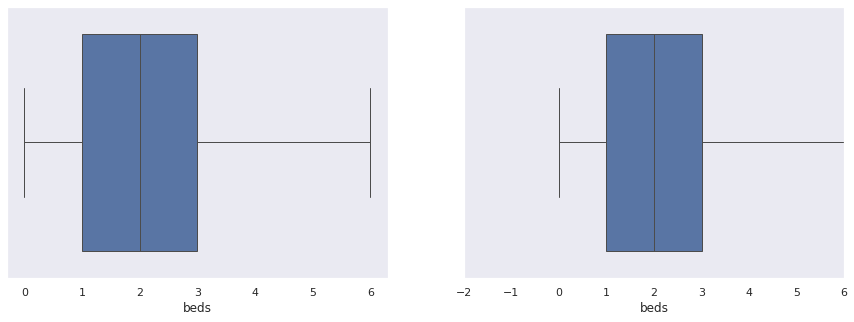

In [189]:
data_airbnb,removed_lines = delete_outliers(data_airbnb,'beds')
print(f'{removed_lines} deleted lines')
boxplot(data_airbnb['beds'])

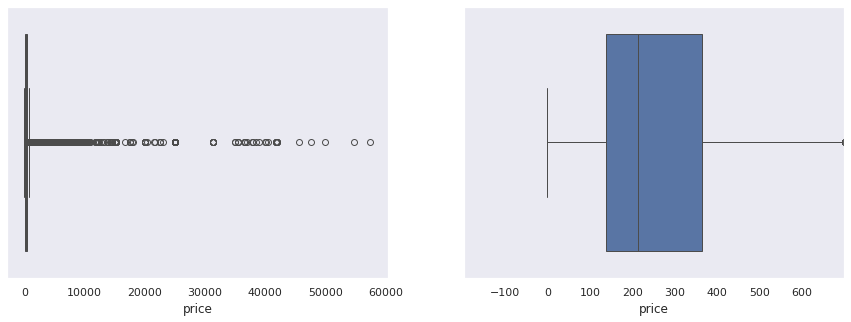

In [190]:
boxplot(data_airbnb['price'])

In [191]:
limits(data_airbnb.price)

(-197.0, 699.0)

In [192]:
prices_over_outliers = data_airbnb.loc[data_airbnb.price >= 699.0]

In [193]:
#print(prices_over_outliers.shape[0])
print(f'{prices_over_outliers.shape[0]} are above the lower limit of the dataframe, which indicates that several accommodations are overpriced in Rio de Janeiro')

21387 are above the lower limit of the dataframe, which indicates that several accommodations are overpriced in Rio de Janeiro


In [194]:
data_airbnb.price.describe()

count    250001.000000
mean        362.703888
std         967.589844
min           0.000000
25%         139.000000
50%         214.000000
75%         363.000000
max       57517.000000
Name: price, dtype: float64

In [195]:
high_prices = data_airbnb.loc[data_airbnb.price > 5000]

In [196]:

import plotly.express as px

# Filtrar os dados para preços altos
high_prices = data_airbnb.loc[data_airbnb.price > 5000]

# Verificar o tamanho do conjunto de dados filtrado
n_rows = len(high_prices)

# Ajustar o tamanho da amostra
sample_size = min(n_rows, 50000)

# Tirar uma amostra dos dados filtrados
amostra = high_prices.sample(n=sample_size)

# Calcular o centro do mapa
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}
# Criar o mapa de densidade
fig = px.density_mapbox(
    amostra,
    lat='latitude',
    lon='longitude',
    z='price',
    radius=2.5,
    center=centro_mapa,
    zoom=10,
    mapbox_style='carto-darkmatter',
    color_continuous_scale='Viridis' 
)

# Exibir o mapa
#px.title('Most expensive Accomodations in Rio De janeiro')
fig.show()


### According to this graphic, it is noted that the highest accommodation prices it is located on the coast of the state of Rio de Janeiro

In [197]:
low_prices = data_airbnb.loc[data_airbnb.price < 500]

In [198]:
import plotly.express as px

# Filtrar os dados para preços altos
low_prices = data_airbnb.loc[data_airbnb.price < 500]

# Verificar o tamanho do conjunto de dados filtrado
n_rows = len(low_prices)

# Ajustar o tamanho da amostra
sample_size = min(n_rows, 50000)

# Tirar uma amostra dos dados filtrados
amostra = low_prices.sample(n=sample_size)

# Calcular o centro do mapa
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}
# Criar o mapa de densidade
fig = px.density_mapbox(
    amostra,
    lat='latitude',
    lon='longitude',
    z='price',
    radius=2.5,
    center=centro_mapa,
    zoom=10,
    mapbox_style='carto-darkmatter',
    color_continuous_scale='Viridis' 
)

# Exibir o mapa
fig.update_layout(title='cheapest places located on the map of Rio de Janeiro')
fig.show()


In [199]:
limits(data_airbnb.price)

(-197.0, 699.0)

In [200]:
data_airbnb.price.info()

<class 'pandas.core.series.Series'>
Index: 250001 entries, 0 to 34966
Series name: price
Non-Null Count   Dtype  
--------------   -----  
250001 non-null  float32
dtypes: float32(1)
memory usage: 2.9 MB


20938 deleted lines


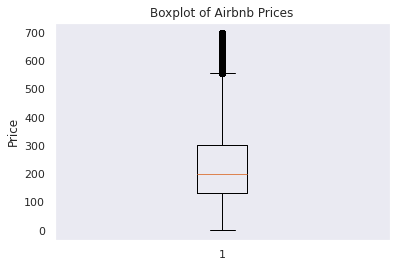

In [201]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert 'price' to numeric, handling errors
data_airbnb['price'] = pd.to_numeric(data_airbnb['price'], errors='coerce')

# Define the function to calculate limits
def limits(coluna):
    Q1 = coluna.quantile(0.25) #quantile = quartil
    Q3 =  coluna.quantile(0.75)
    amplitude = Q3 - Q1
    limite_inferior = Q1 - 1.5 * amplitude
    limite_superior = Q3 + 1.5 * amplitude
    return limite_inferior, limite_superior

# Define the function to delete outliers
def delete_outliers(data, column_name):
    total_lines = data.shape[0]
    inferior_limits, superior_limits = limits(data[column_name])
    data = data.loc[(data[column_name] >= inferior_limits) & (data[column_name] <= superior_limits), :]
    removed_lines = total_lines - data.shape[0]
    return data, removed_lines

# Remove outliers and print the number of deleted lines
data_airbnb, removed_lines = delete_outliers(data_airbnb, 'price')
print(f'{removed_lines} deleted lines')

# Plot the boxplot for the 'price' column
plt.boxplot(data_airbnb['price'].dropna())
plt.title('Boxplot of Airbnb Prices')
plt.ylabel('Price')
plt.show()


In [202]:
def bar_plot(column):
    plt.figure(figsize=(15,5))
    ax = sns.barplot(x=column.value_counts())
    ax.set_xlim(limits(column))
    return

(-55.0, 305.0)

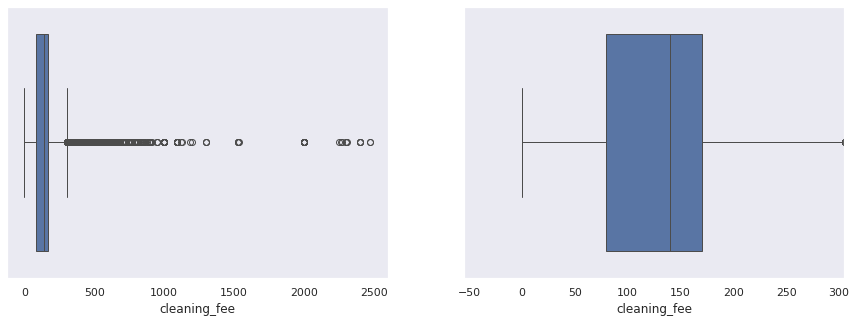

In [203]:
boxplot(data_airbnb['cleaning_fee'])
limits(data_airbnb.cleaning_fee)

In [204]:
data_airbnb.loc[(data_airbnb.cleaning_fee > 305.0) & (data_airbnb.price > 699.0)].head()

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month


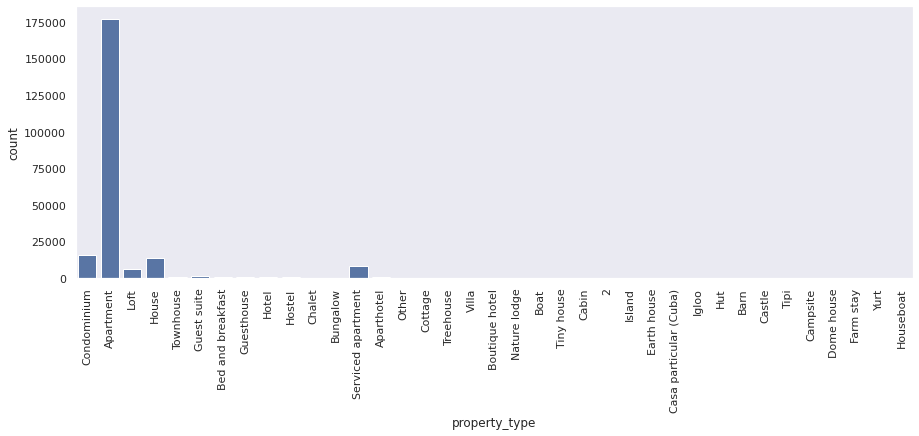

In [205]:
table_property_types = data_airbnb.property_type.value_counts()
#print(table_property_types)
columns_groupby = []
#print(table_property_types.index)
for type_ in table_property_types.index:
    if table_property_types[type_] < 2000:
        columns_groupby.append(type_)
plt.figure(figsize=(15,5))
sns.set_theme(style='dark')
countplot = sns.countplot(x=data_airbnb['property_type'])
countplot.tick_params(axis='x',rotation=90)
    

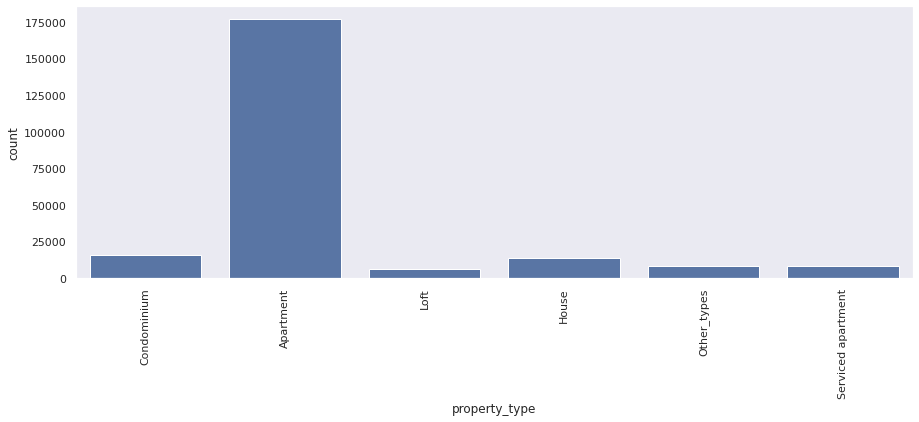

In [206]:
for type_ in columns_groupby:
    data_airbnb.loc[data_airbnb.property_type == type_,'property_type'] = 'Other_types'
plt.figure(figsize=(15,5))
sns.set_theme(style='dark')
countplot = sns.countplot(x=data_airbnb['property_type'])
countplot.tick_params(axis='x',rotation=90)

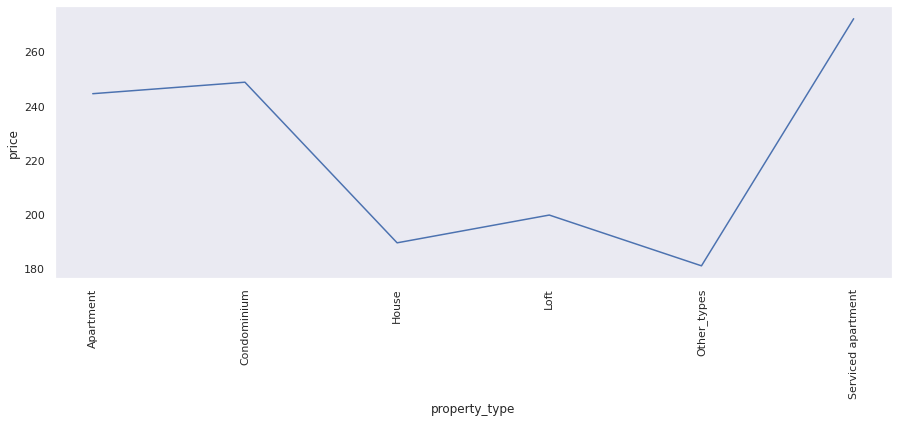

In [207]:
prices_property_type_ = data_airbnb.groupby('property_type')['price'].mean()
plt.figure(figsize=(15,5))
lineplot = sns.lineplot(prices_property_type_);
lineplot.tick_params(axis='x',rotation=90);

In [208]:
print(type(prices_property_type_))

<class 'pandas.core.series.Series'>


In [209]:
prices_property_type_df = prices_property_type_.reset_index()

In [210]:
print(type(prices_property_type_df ))

<class 'pandas.core.frame.DataFrame'>


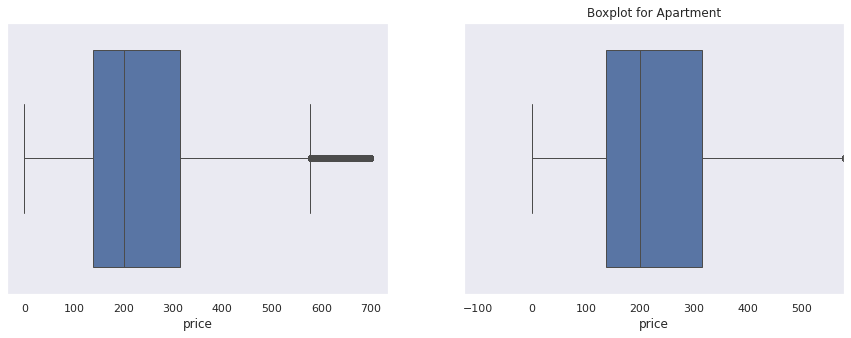

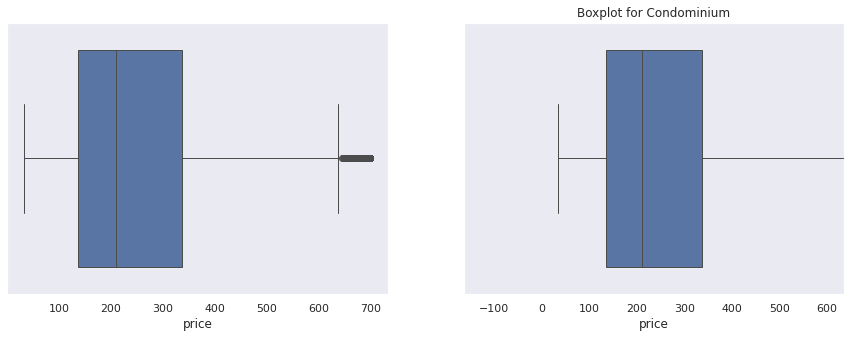

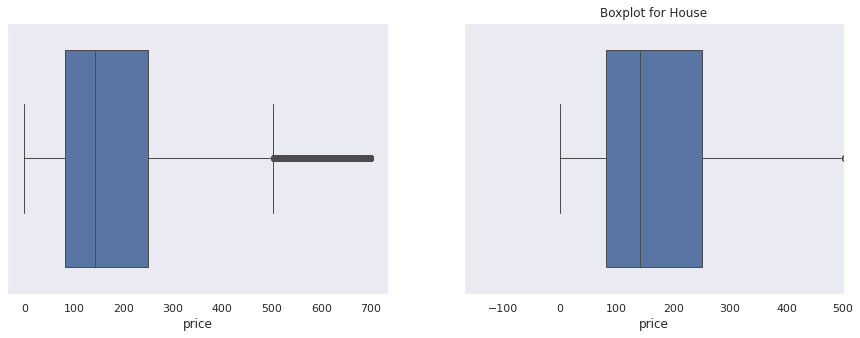

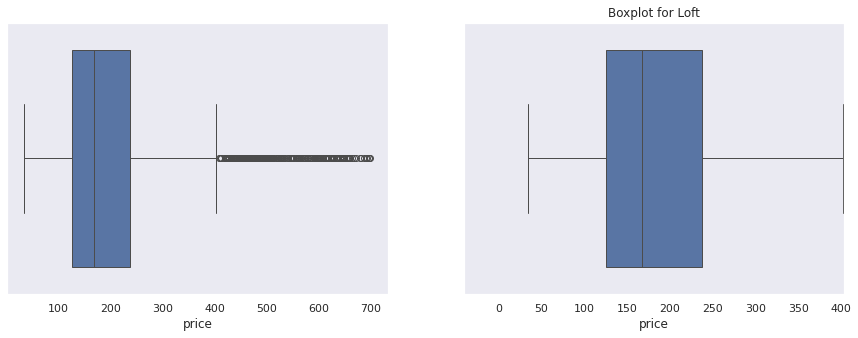

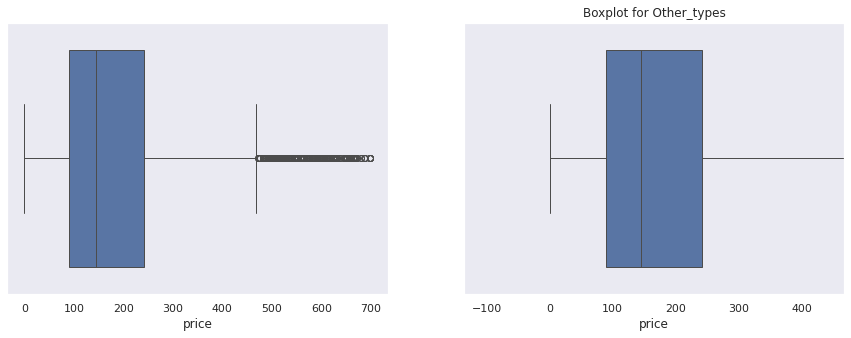

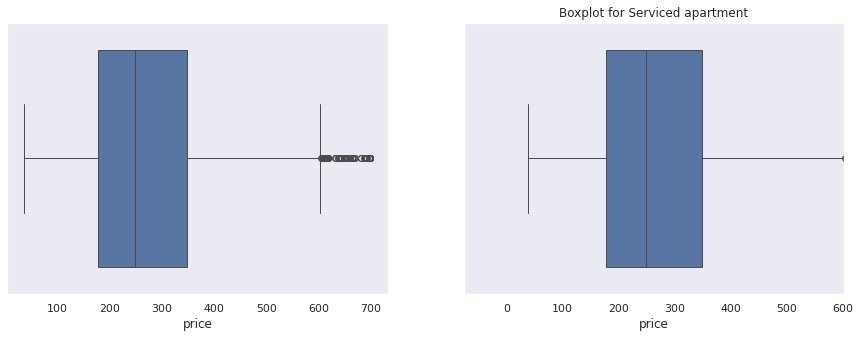

In [211]:
#Iterating over the property types and creating the boxplots
for property_type in prices_property_type_df['property_type']:
    boxplot(data_airbnb[data_airbnb['property_type'] == property_type]['price'])
    plt.title(f'Boxplot for {property_type}')
    plt.show()



### so we conclude that 'loft' has the most expensive accommodation possible even though it does not have the largest number of lines

In [212]:
prices_property_type_df

,property_type,price
0,Apartment,244.438660
1,Condominium,248.681351
2,House,189.346695
3,Loft,199.605927
4,Other_types,180.851013
5,Serviced apartment,272.132050


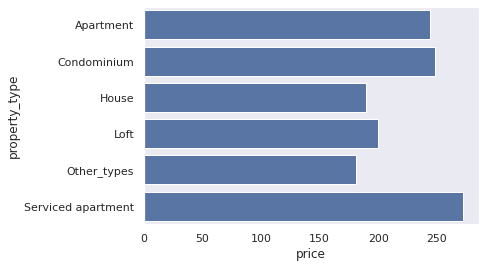

In [213]:
#print(prices_property_type_df.price)
sns.barplot(x=prices_property_type_df.price,y=prices_property_type_df.property_type);

### Apartments are the most expensive on average

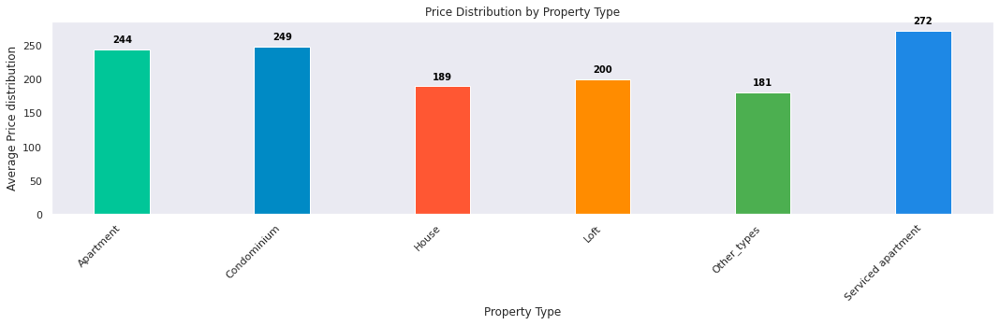

In [214]:
fig, ax = plt.subplots(figsize=(15, 5))

wid = 0.35

index = np.arange(len(prices_property_type_df))

colors = ['#00c698', '#008ac5', '#ff5733', '#ff8c00', '#4caf50', '#1e88e5']

ax.bar(
    index, 
    prices_property_type_df.price.values,
    color=[colors[i % len(colors)] for i in range(len(prices_property_type_df))],
    label=prices_property_type_df.property_type.values,
    width=wid
)

for i, price in enumerate(prices_property_type_df.price.values):
    ax.annotate(
        '{:,.0f}'.format(price),
        (index[i], price), 
        ha="center",
        va="bottom",
        xytext=(0, 5),
        textcoords="offset points",
        fontsize=10,
        fontweight='bold',
        color="#000000"
    )


ax.set_xticks(index)
ax.set_xticklabels(prices_property_type_df.property_type.values, rotation=45, ha="right")
ax.set_xlabel('Property Type')
ax.set_ylabel('Average Price distribution')
ax.set_title('Price Distribution by Property Type')
plt.tight_layout() 
plt.show()


In [215]:
data_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 229063 entries, 0 to 34966
Data columns (total 40 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   description                                   229063 non-null  object 
 1   host_response_time                            229063 non-null  object 
 2   host_response_rate                            229063 non-null  object 
 3   host_listings_count                           229063 non-null  int16  
 4   host_identity_verified                        229063 non-null  object 
 5   neighbourhood_cleansed                        229063 non-null  object 
 6   latitude                                      229063 non-null  float64
 7   longitude                                     229063 non-null  float64
 8   is_location_exact                             229063 non-null  object 
 9   property_type                                 229063 n

### Colum accommodates

(-2.5, 9.5)

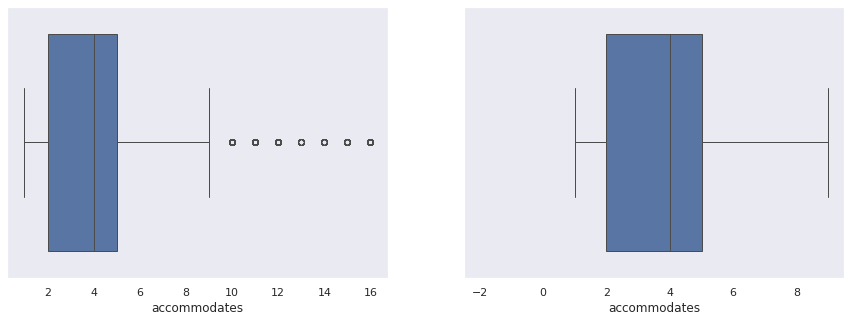

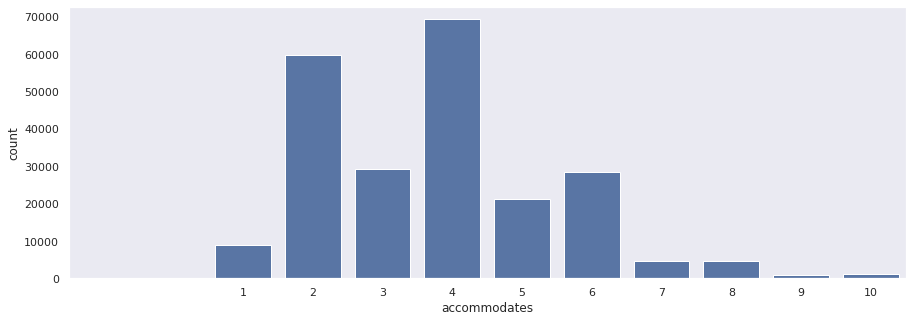

In [216]:
def graphic_plot(column):
    plt.figure(figsize=(15,5))
    ax = sns.barplot(x=column.value_counts().index,y=column.value_counts())
    ax.set_xlim(limits(column))
    return

boxplot(data_airbnb.accommodates)
graphic_plot(data_airbnb.accommodates)
limits(data_airbnb.accommodates)

In [217]:
data_airbnb.loc[data_airbnb.accommodates > 20]

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month


### Number of amenities

In [218]:
data_airbnb['amenities'] = data_airbnb['amenities'].astype(str)

In [219]:
data_airbnb['amenities'] = data_airbnb['amenities'].fillna('')

In [220]:
print(data_airbnb.amenities.value_counts())

amenities
{}                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             249
{TV,"Cable TV",Wifi,"Air conditioning",Kitchen,Elevator,Hangers,Iron,"Private entrance","Hot water","Bed linens","Extra pillows and blankets",Microwave,"Coffee maker",Refrigerator,"Dishes and silverware","Cooking basics",Oven,Stove}                                                                                                                                                                                                                                                                   

In [221]:
print(data_airbnb['amenities'].iloc[0])

{TV,"Cable TV",Internet,Wifi,"Air conditioning",Kitchen,"Paid parking off premises","Smoking allowed",Doorman,Elevator,"Hot tub","Family/kid friendly","Suitable for events",Essentials,"24-hour check-in",Hangers,"Hair dryer",Iron,"Laptop friendly workspace","Self check-in","Building staff","Private entrance","Hot water","Bed linens",Microwave,"Coffee maker",Refrigerator,"Dishes and silverware","Cooking basics",Oven,Stove,"Patio or balcony","Luggage dropoff allowed"}


In [222]:
print(data_airbnb['amenities'].iloc[0].split(','))

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', '"Paid parking off premises"', '"Smoking allowed"', 'Doorman', 'Elevator', '"Hot tub"', '"Family/kid friendly"', '"Suitable for events"', 'Essentials', '"24-hour check-in"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"', '"Self check-in"', '"Building staff"', '"Private entrance"', '"Hot water"', '"Bed linens"', 'Microwave', '"Coffee maker"', 'Refrigerator', '"Dishes and silverware"', '"Cooking basics"', 'Oven', 'Stove', '"Patio or balcony"', '"Luggage dropoff allowed"}']


In [223]:
print(len(data_airbnb['amenities'].iloc[1].split(',')))

14


In [224]:
data_airbnb['Number_amenities'] = data_airbnb['amenities'].str.split(',').apply(len)

In [225]:
data_airbnb.head()

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month,Number_amenities
0,Pls note that special rates apply for Carnival...,within an hour,100%,2,t,Copacabana,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",323.0,368.0,2,61,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,292,246,28.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,33
1,"Our apartment is a little gem, everyone loves ...",within a day,91%,3,t,Copacabana,-22.97712,-43.19045,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",159.0,250.0,2,45,7,60,7.0,7.0,60.0,60.0,7.0,60.0,2 months ago,133,236,16.0,f,strict_14_with_grace_period,3,3.0,0.0,2019,12,14
2,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,1,t,Ipanema,-22.98302,-43.21427,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",266.0,82.0,2,41,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,a week ago,115,274,40.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,25
3,This cosy apartment is just a few steps away ...,within an hour,100%,1,t,Ipanema,-22.98816,-43.19359,t,Apartment,Entire home/apt,2,1.5,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",368.0,168.0,2,61,2,89,2.0,2.0,89.0,89.0,2.0,89.0,3 months ago,90,171,33.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,34
4,Our newly renovated studio is located in the b...,within an hour,100%,1,t,Copacabana,-22.98127,-43.19046,t,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",131.0,140.0,2,80,3,28,3.0,3.0,28.0,28.0,3.0,28.0,5 weeks ago,141,320,41.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,41


In [226]:
# Remove outliers and print the number of deleted lines
data_airbnb, removed_lines = delete_outliers(data_airbnb, 'Number_amenities')
print(f'{removed_lines} deleted lines')

3943 deleted lines


(-7.0, 49.0)

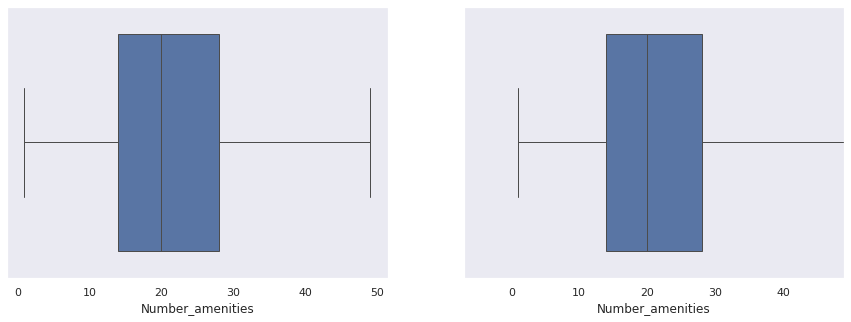

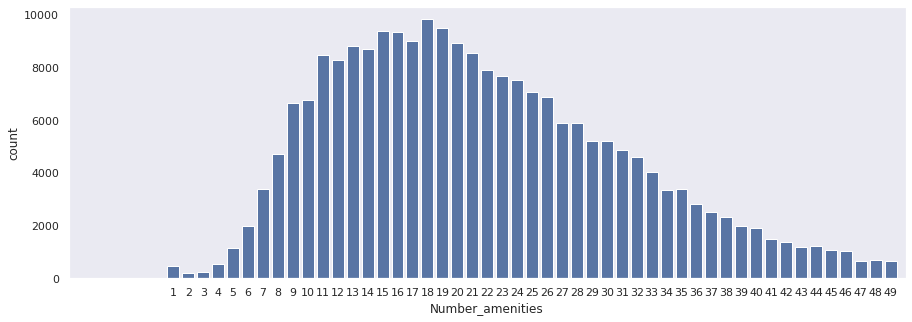

In [227]:
boxplot(data_airbnb['Number_amenities'])
graphic_plot(data_airbnb['Number_amenities'])
limits(data_airbnb.Number_amenities)

In [228]:
data_airbnb = data_airbnb.drop(['amenities'],axis=1)


In [229]:
data_airbnb.head()

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month,Number_amenities
0,Pls note that special rates apply for Carnival...,within an hour,100%,2,t,Copacabana,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,323.0,368.0,2,61,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,292,246,28.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,33
1,"Our apartment is a little gem, everyone loves ...",within a day,91%,3,t,Copacabana,-22.97712,-43.19045,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,159.0,250.0,2,45,7,60,7.0,7.0,60.0,60.0,7.0,60.0,2 months ago,133,236,16.0,f,strict_14_with_grace_period,3,3.0,0.0,2019,12,14
2,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,1,t,Ipanema,-22.98302,-43.21427,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,266.0,82.0,2,41,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,a week ago,115,274,40.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,25
3,This cosy apartment is just a few steps away ...,within an hour,100%,1,t,Ipanema,-22.98816,-43.19359,t,Apartment,Entire home/apt,2,1.5,1.0,1.0,Real Bed,368.0,168.0,2,61,2,89,2.0,2.0,89.0,89.0,2.0,89.0,3 months ago,90,171,33.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,34
4,Our newly renovated studio is located in the b...,within an hour,100%,1,t,Copacabana,-22.98127,-43.19046,t,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,131.0,140.0,2,80,3,28,3.0,3.0,28.0,28.0,3.0,28.0,5 weeks ago,141,320,41.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,41


room_type
Entire home/apt    168076
Private room        52357
Shared room          3458
Hotel room           1200
2                      29
Name: count, dtype: int64


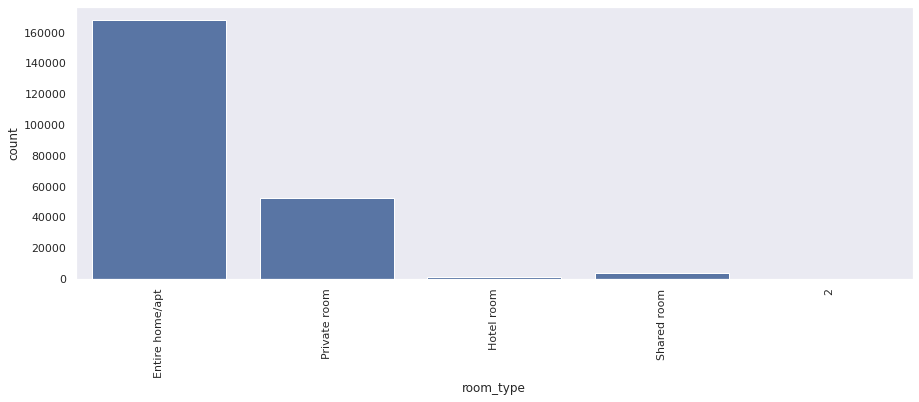

In [230]:
print(data_airbnb['room_type'].value_counts())

plt.figure(figsize=(15,5))

sns.set_theme(style='dark')
countplot = sns.countplot(x=data_airbnb['room_type'])
countplot.tick_params(axis='x',rotation=90)

bed_type
Real Bed         222567
Pull-out Sofa      1812
Futon               497
Airbed              111
Couch               104
2                    29
Name: count, dtype: int64


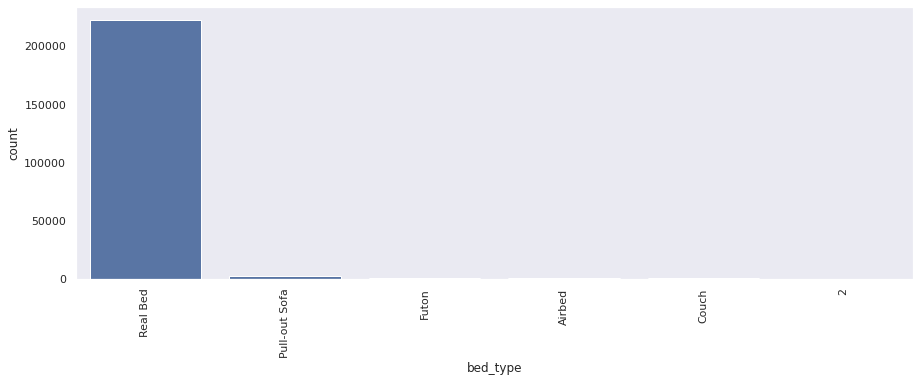

In [231]:
#bed_type


print(data_airbnb['bed_type'].value_counts())

plt.figure(figsize=(15,5))

sns.set_theme(style='dark')
countplot = sns.countplot(x=data_airbnb['bed_type'])
countplot.tick_params(axis='x',rotation=90)

cancellation_policy
strict_14_with_grace_period    115351
flexible                        55287
moderate                        48738
super_strict_60                  3951
super_strict_30                  1743
2                                  29
strict                             21
Name: count, dtype: int64
--------------------------------------------------------------------------------
['super_strict_60', 'super_strict_30', 2, 'strict']
cancellation_policy
strict_14_with_grace_period    115351
flexible                        55287
moderate                        48738
strict                           5744
Name: count, dtype: int64


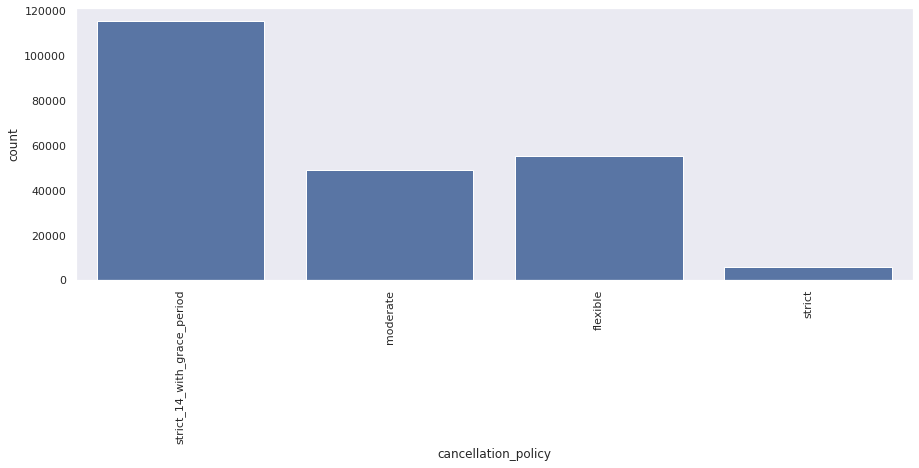

In [232]:
print(data_airbnb.cancellation_policy.value_counts())
print('-'*80)
# super_strict_60                  5344
# super_strict_30                  2224
#basically that means strict!
table_cancellation = data_airbnb.cancellation_policy.value_counts()
group_columns = []
for type_ in table_cancellation.index:
    if table_cancellation[type_] < 10000:
        group_columns.append(type_)
print(group_columns)
for type_ in group_columns:
    data_airbnb.loc[data_airbnb.cancellation_policy ==type_,'cancellation_policy'] = 'strict'
print(data_airbnb['cancellation_policy'].value_counts())
plt.figure(figsize=(15,5))
sns.set_theme(style='dark')
countplot = sns.countplot(x=data_airbnb['cancellation_policy'])
countplot.tick_params(axis='x',rotation=90)

In [233]:
display(data_airbnb.head())
data_airbnb.info()

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month,Number_amenities
0,Pls note that special rates apply for Carnival...,within an hour,100%,2,t,Copacabana,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,323.0,368.0,2,61,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,292,246,28.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,33
1,"Our apartment is a little gem, everyone loves ...",within a day,91%,3,t,Copacabana,-22.97712,-43.19045,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,159.0,250.0,2,45,7,60,7.0,7.0,60.0,60.0,7.0,60.0,2 months ago,133,236,16.0,f,strict_14_with_grace_period,3,3.0,0.0,2019,12,14
2,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,1,t,Ipanema,-22.98302,-43.21427,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,266.0,82.0,2,41,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,a week ago,115,274,40.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,25
3,This cosy apartment is just a few steps away ...,within an hour,100%,1,t,Ipanema,-22.98816,-43.19359,t,Apartment,Entire home/apt,2,1.5,1.0,1.0,Real Bed,368.0,168.0,2,61,2,89,2.0,2.0,89.0,89.0,2.0,89.0,3 months ago,90,171,33.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,34
4,Our newly renovated studio is located in the b...,within an hour,100%,1,t,Copacabana,-22.98127,-43.19046,t,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,131.0,140.0,2,80,3,28,3.0,3.0,28.0,28.0,3.0,28.0,5 weeks ago,141,320,41.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,41


<class 'pandas.core.frame.DataFrame'>
Index: 225120 entries, 0 to 34966
Data columns (total 40 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   description                                   225120 non-null  object 
 1   host_response_time                            225120 non-null  object 
 2   host_response_rate                            225120 non-null  object 
 3   host_listings_count                           225120 non-null  int16  
 4   host_identity_verified                        225120 non-null  object 
 5   neighbourhood_cleansed                        225120 non-null  object 
 6   latitude                                      225120 non-null  float64
 7   longitude                                     225120 non-null  float64
 8   is_location_exact                             225120 non-null  object 
 9   property_type                                 225120 n

###Number of Amenities vs. Price
Hypothesis: Listings with more amenities are priced higher.
Graph: Scatter plot or bar chart -->

In [234]:
price_amenities = data_airbnb.groupby('Number_amenities')['price'].mean().reset_index()

In [235]:
import plotly.express as px

fig = px.scatter(price_amenities, x='Number_amenities', y='price', 
                 title='Average Price vs. Number of Amenities',
                 labels={'Number_amenities': 'Number of Amenities', 'price': 'Average Price'})
fig.show()

In [236]:
import plotly.express as px
fig = px.bar(price_amenities, x='Number_amenities', y='price', 
             title='Average Price vs. Number of Amenities',
             labels={'Number_amenities': 'Number of Amenities', 'price': 'Average Price'})
fig.show()

In [237]:
print(data_airbnb.columns)

Index(['description', 'host_response_time', 'host_response_rate',
       'host_listings_count', 'host_identity_verified',
       'neighbourhood_cleansed', 'latitude', 'longitude', 'is_location_exact',
       'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'bed_type', 'price', 'cleaning_fee', 'guests_included',
       'extra_people', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'instant_bookable', 'cancellation_policy',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms', 'year', 'month',
       'Number_amenities'],
      dtype='object')


# Host Response Time vs. Number of Reviews

# Hypothesis: Hosts who respond quickly might receive more reviews.
# Graph: Box plot or bar chart.

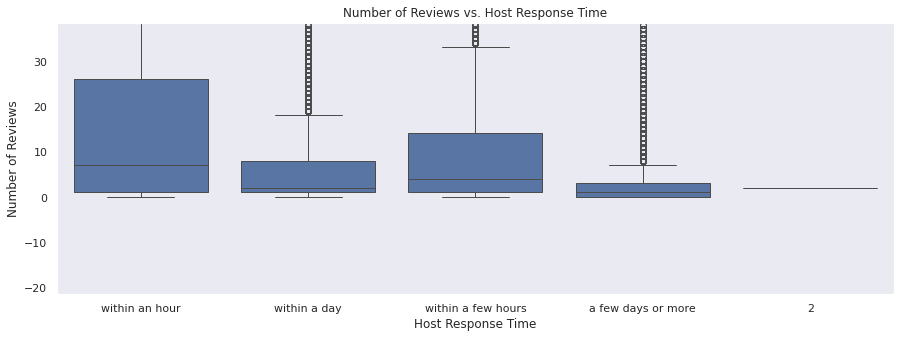

In [238]:
plt.figure(figsize=(15,5))
sns.boxplot(x='host_response_time',y='number_of_reviews',data=data_airbnb);

# Calcular os limites para 'number_of_reviews'
limite_inferior, limite_superior = limits(data_airbnb['number_of_reviews'])

plt.ylim(limite_inferior, limite_superior)

plt.title('Number of Reviews vs. Host Response Time')
plt.xlabel('Host Response Time')
plt.ylabel('Number of Reviews')

plt.show()

In [239]:
beds_price = data_airbnb.groupby('beds')['price'].mean().reset_index()
beds_price.head()

,beds,price
0,0.0,225.142792
1,1.0,181.993591
2,2.0,230.610214
3,3.0,288.712463
4,4.0,302.652466


In [240]:
import plotly.express as px

fig = px.bar(beds_price, x='beds', y='price', 
                 title='Average Price vs. beds',
                 labels={'beds': ' Number of beds', 'price': 'Average Price'})
fig.show()

fig = px.line(beds_price, x='beds', y='price', 
                 title='Average Price vs. beds',
                 labels={'beds': ' Number of beds', 'price': 'Average Price'})
fig.show()

# NuPrice vs. Number of Bedrooms/Bathrooms

# Hypothesis: Listings with more bedrooms and bathrooms generally cost more.
# Graph: Scatter plot with a trend line.

In [241]:
beds_bedrooms = data_airbnb.groupby(['bedrooms','beds'])['price'].mean().reset_index()
beds_bedrooms.head()

,bedrooms,beds,price
0,0.0,0.0,197.816666
1,0.0,1.0,183.081497
2,0.0,2.0,185.843277
3,0.0,3.0,194.195053
4,0.0,4.0,200.097900


# Price vs. Room Type

# Hypothesis: Different room types (entire home, private room, shared room) might have different price ranges.
# Graph: Box plot or bar chart.

In [242]:
import plotly.express as px

# Assume df is your DataFrame
fig = px.box(df, x='room_type', y='price', title='Price Distribution by Room Type')
fig.show()


In [243]:
data_airbnb.head()

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month,Number_amenities
0,Pls note that special rates apply for Carnival...,within an hour,100%,2,t,Copacabana,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,323.0,368.0,2,61,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,292,246,28.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,33
1,"Our apartment is a little gem, everyone loves ...",within a day,91%,3,t,Copacabana,-22.97712,-43.19045,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,159.0,250.0,2,45,7,60,7.0,7.0,60.0,60.0,7.0,60.0,2 months ago,133,236,16.0,f,strict_14_with_grace_period,3,3.0,0.0,2019,12,14
2,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,1,t,Ipanema,-22.98302,-43.21427,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,266.0,82.0,2,41,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,a week ago,115,274,40.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,25
3,This cosy apartment is just a few steps away ...,within an hour,100%,1,t,Ipanema,-22.98816,-43.19359,t,Apartment,Entire home/apt,2,1.5,1.0,1.0,Real Bed,368.0,168.0,2,61,2,89,2.0,2.0,89.0,89.0,2.0,89.0,3 months ago,90,171,33.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,34
4,Our newly renovated studio is located in the b...,within an hour,100%,1,t,Copacabana,-22.98127,-43.19046,t,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,131.0,140.0,2,80,3,28,3.0,3.0,28.0,28.0,3.0,28.0,5 weeks ago,141,320,41.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,41


In [244]:
print(data_airbnb.iloc[50])
print('-'*80)
data_airbnb

description                                     Very comfortable and spacious suite with some ...
host_response_time                                                             within a few hours
host_response_rate                                                                           100%
host_listings_count                                                                             4
host_identity_verified                                                                          t
neighbourhood_cleansed                                                                    Humaitá
latitude                                                                                -22.96099
longitude                                                                               -43.19934
is_location_exact                                                                               f
property_type                                                                               House
room_type           

,description,host_response_time,host_response_rate,host_listings_count,host_identity_verified,neighbourhood_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_365,number_of_reviews,number_of_reviews_ltm,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month,Number_amenities
0,Pls note that special rates apply for Carnival...,within an hour,100%,2,t,Copacabana,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,323.0,368.0,2,61,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,a week ago,292,246,28.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,33
1,"Our apartment is a little gem, everyone loves ...",within a day,91%,3,t,Copacabana,-22.97712,-43.19045,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,159.0,250.0,2,45,7,60,7.0,7.0,60.0,60.0,7.0,60.0,2 months ago,133,236,16.0,f,strict_14_with_grace_period,3,3.0,0.0,2019,12,14
2,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,1,t,Ipanema,-22.98302,-43.21427,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,266.0,82.0,2,41,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,a week ago,115,274,40.0,t,strict_14_with_grace_period,1,1.0,0.0,2019,12,25
3,This cosy apartment is just a few steps away ...,within an hour,100%,1,t,Ipanema,-22.98816,-43.19359,t,Apartment,Entire home/apt,2,1.5,1.0,1.0,Real Bed,368.0,168.0,2,61,2,89,2.0,2.0,89.0,89.0,2.0,89.0,3 months ago,90,171,33.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,34
4,Our newly renovated studio is located in the b...,within an hour,100%,1,t,Copacabana,-22.98127,-43.19046,t,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,131.0,140.0,2,80,3,28,3.0,3.0,28.0,28.0,3.0,28.0,5 weeks ago,141,320,41.0,f,strict_14_with_grace_period,1,1.0,0.0,2019,12,41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34940,Este apartamento fica na Avenida Nossa Senhora...,within an hour,100%,7,f,Copacabana,-22.98154,-43.18974,t,Apartment,Entire home/apt,6,1.0,1.0,1.0,Real Bed,191.0,70.0,1,0,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,yesterday,240,0,0.0,f,flexible,20,18.0,2.0,2019,8,12
34945,Excellent apartment located less than 2 km fro...,within an hour,100%,60,f,Jacarepaguá,-22.97038,-43.39403,t,Apartment,Entire home/apt,3,2.0,2.0,2.0,Real Bed,250.0,200.0,2,30,1,1125,1.0,5.0,90.0,1125.0,1.8,493.8,today,191,0,0.0,t,strict_14_with_grace_period,47,47.0,0.0,2019,8,35
34950,Apartamento aconchegante com vista montanha no...,within an hour,100%,18,t,Recreio dos Bandeirantes,-23.02270,-43.51394,t,Condominium,Entire home/apt,5,2.0,2.0,4.0,Real Bed,342.0,200.0,1,20,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,today,299,0,0.0,f,moderate,16,13.0,3.0,2019,8,20
34960,O espaço perfeito na MELHOR localização conhec...,within an hour,100%,2,t,Copacabana,-22.98380,-43.19093,t,Apartment,Entire home/apt,4,1.0,1.0,2.0,Real Bed,139.0,112.0,1,0,2,1125,2.0,4.0,1125.0,1125.0,2.1,1125.0,today,161,0,0.0,t,flexible,2,2.0,0.0,2019,8,16


In [245]:
columns_True_False = ['instant_bookable','host_identity_verified','is_location_exact','host_identity_verified']

data_airbnb_encoded = data_airbnb.copy()
for columns in columns_True_False:
    data_airbnb_encoded.loc[data_airbnb[columns]=='t',columns] = 1
    data_airbnb_encoded.loc[data_airbnb[columns]=='f',columns] = 0
    
data_airbnb_encoded.info()
print('-'*80)
print(data_airbnb_encoded.iloc[50])
    
    


<class 'pandas.core.frame.DataFrame'>
Index: 225120 entries, 0 to 34966
Data columns (total 40 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   description                                   225120 non-null  object 
 1   host_response_time                            225120 non-null  object 
 2   host_response_rate                            225120 non-null  object 
 3   host_listings_count                           225120 non-null  int16  
 4   host_identity_verified                        225120 non-null  object 
 5   neighbourhood_cleansed                        225120 non-null  object 
 6   latitude                                      225120 non-null  float64
 7   longitude                                     225120 non-null  float64
 8   is_location_exact                             225120 non-null  object 
 9   property_type                                 225120 n

In [246]:
data_airbnb_encoded = data_airbnb_encoded.drop('description',axis=1)
data_airbnb_encoded = data_airbnb_encoded.drop('neighbourhood_cleansed',axis=1)
data_airbnb_encoded = data_airbnb_encoded.drop('host_response_rate',axis=1)
data_airbnb_encoded = data_airbnb_encoded.drop('host_response_time',axis=1)
data_airbnb_encoded = data_airbnb_encoded.drop('calendar_updated',axis=1)
data_airbnb_encoded = data_airbnb_encoded.drop('host_identity_verified',axis=1)
data_airbnb_encoded = data_airbnb_encoded.drop('instant_bookable',axis=1)

In [247]:
categoric_columns = ['property_type','room_type','bed_type','cancellation_policy','is_location_exact']

#Dummies

data_airbnb_encoded = pd.get_dummies(data=data_airbnb_encoded,columns=categoric_columns,dtype=int)

display(data_airbnb_encoded.head())

,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,number_of_reviews_ltm,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,year,month,Number_amenities,property_type_Apartment,property_type_Condominium,property_type_House,property_type_Loft,property_type_Other_types,property_type_Serviced apartment,room_type_2,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,bed_type_2,bed_type_Airbed,bed_type_Couch,bed_type_Futon,bed_type_Pull-out Sofa,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period,is_location_exact_0,is_location_exact_1,is_location_exact_2
0,2,-22.96592,-43.17896,5,1.0,2.0,2.0,323.0,368.0,2,61,4,30,4.0,4.0,1125.0,1125.0,4.0,1125.0,292,246,28.0,1,1.0,0.0,2019,12,33,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0
1,3,-22.97712,-43.19045,2,1.0,1.0,2.0,159.0,250.0,2,45,7,60,7.0,7.0,60.0,60.0,7.0,60.0,133,236,16.0,3,3.0,0.0,2019,12,14,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0
2,1,-22.98302,-43.21427,3,1.0,1.0,2.0,266.0,82.0,2,41,2,1125,2.0,5.0,1125.0,1125.0,2.1,1125.0,115,274,40.0,1,1.0,0.0,2019,12,25,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0
3,1,-22.98816,-43.19359,2,1.5,1.0,1.0,368.0,168.0,2,61,2,89,2.0,2.0,89.0,89.0,2.0,89.0,90,171,33.0,1,1.0,0.0,2019,12,34,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0
4,1,-22.98127,-43.19046,2,1.0,1.0,1.0,131.0,140.0,2,80,3,28,3.0,3.0,28.0,28.0,3.0,28.0,141,320,41.0,1,1.0,0.0,2019,12,41,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0


In [248]:
data_airbnb_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 225120 entries, 0 to 34966
Data columns (total 52 columns):
 #   Column                                           Non-Null Count   Dtype  
---  ------                                           --------------   -----  
 0   host_listings_count                              225120 non-null  int16  
 1   latitude                                         225120 non-null  float64
 2   longitude                                        225120 non-null  float64
 3   accommodates                                     225120 non-null  int16  
 4   bathrooms                                        225120 non-null  float64
 5   bedrooms                                         225120 non-null  float64
 6   beds                                             225120 non-null  float64
 7   price                                            225120 non-null  float32
 8   cleaning_fee                                     225120 non-null  float32
 9   guests_included      

In [249]:
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor , ExtraTreesRegressor

def evaluate_model(model_name, y_test, prediction):
    r2 = r2_score(y_test, prediction)
    RMSE = np.sqrt(mean_squared_error(y_test, prediction))
    return f'A.I model {model_name}:\nr2: {r2:.2%}\nRMSE: {RMSE:.2f}'


### 3 types of IA models to use

In [250]:
model_rf = RandomForestRegressor()
model_lf = LinearRegression()
model_et = ExtraTreesRegressor()


models =  {'RandomForest':model_rf,
           'LinearRegression':model_lf,
           'Extratrees':model_et,
           }

y = data_airbnb_encoded['price']
x = data_airbnb_encoded.drop('price',axis=1)
# print(X_train.shape)
# print(X_test.shape)
# print(X_train.columns)
# print(X_test.columns)
# print(X_train.dtypes)
# print(X_test.dtypes)

In [251]:

X_train,X_test,y_train,y_test  =  train_test_split(x,y,random_state=10)

print(X_train.dtypes)
print('-'*80)
print(X_test.dtypes)


host_listings_count                                  int16
latitude                                           float64
longitude                                          float64
accommodates                                         int16
bathrooms                                          float64
bedrooms                                           float64
beds                                               float64
cleaning_fee                                       float32
guests_included                                      int64
extra_people                                         int16
minimum_nights                                       int64
maximum_nights                                       int64
minimum_minimum_nights                             float64
maximum_minimum_nights                             float64
minimum_maximum_nights                             float64
maximum_maximum_nights                             float64
minimum_nights_avg_ntm                             float

In [252]:
for name_model,model in models.items():
    #train
    model.fit(X_train,y_train)
    #testar
    prediction = model.predict(X_test)
    print(evaluate_model(name_model,y_test,prediction))

A.I model RandomForest:
r2: 92.68%
RMSE: 38.93
A.I model LinearRegression:
r2: 40.85%
RMSE: 110.63
A.I model Extratrees:
r2: 94.42%
RMSE: 33.97


In [256]:
# print(model_et.feature_importances_)
# print(X_train.columns)

importance_features = pd.DataFrame(model_et.feature_importances_,X_train.columns)
importance_features = importance_features.sort_values(by=0,ascending=False)
print(importance_features)

                                                        0
bedrooms                                         0.147422
room_type_Entire home/apt                        0.084321
bathrooms                                        0.075418
latitude                                         0.071929
cleaning_fee                                     0.053351
longitude                                        0.045092
extra_people                                     0.042851
accommodates                                     0.039413
number_of_reviews_ltm                            0.039038
number_of_reviews                                0.027582
Number_amenities                                 0.025535
guests_included                                  0.024720
beds                                             0.022109
host_listings_count                              0.021294
availability_365                                 0.021034
calculated_host_listings_count_entire_homes      0.019111
calculated_hos

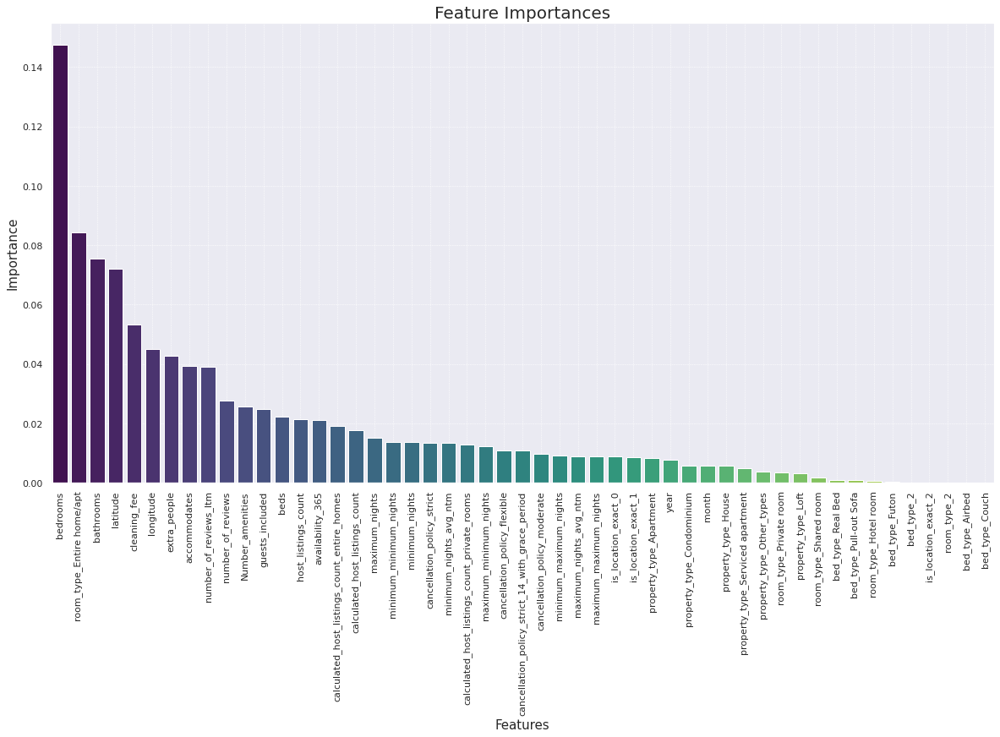

In [254]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

importance_features = pd.DataFrame({'Feature': X_train.columns, 'Importance': model_et.feature_importances_})
importance_features = importance_features.sort_values(by='Importance', ascending=False)

# Plotagem aprimorada
plt.figure(figsize=(20, 10))
ax = sns.barplot(x=importance_features['Feature'], y=importance_features['Importance'], palette='viridis', data=importance_features)
ax.tick_params(axis='x', rotation=90)
ax.set_title('Feature Importances', fontsize=20)
ax.set_xlabel('Features', fontsize=15)
ax.set_ylabel('Importance', fontsize=15)
ax.grid(True, linestyle='--', linewidth=0.5)

plt.show()


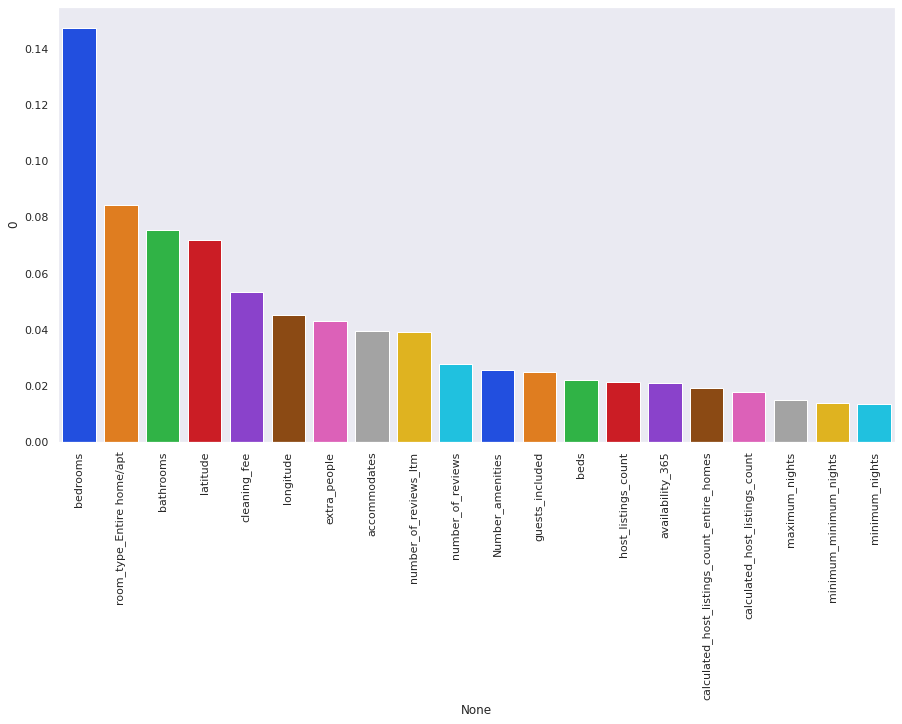

In [257]:
importance_features_top_20 = importance_features.head(20)
importance_features_top_20 = importance_features_top_20.sort_values(by=0,ascending=False)
plt.figure(figsize=(15, 8))  # Ajuste o tamanho da figura conforme necessário
ax = sns.barplot(x=importance_features_top_20.index, y=importance_features_top_20[0],palette='bright')
ax.tick_params(axis='x',rotation=90)

In [258]:
y = data_airbnb_encoded['price']
x = data_airbnb_encoded.drop('price',axis=1)


X_train,X_test,y_train,y_test = train_test_split(x,y,random_state=10)
for name_model,model in models.items():
    #test
    predict = model.predict(X_test)
    print(evaluate_model(name_model,y_test,predict))

A.I model RandomForest:
r2: 92.68%
RMSE: 38.93
A.I model LinearRegression:
r2: 40.85%
RMSE: 110.63
A.I model Extratrees:
r2: 94.42%
RMSE: 33.97


In [259]:
df_test = data_airbnb_encoded.copy()

for column in df_test.copy():
    if 'bed_type' in column:
        df_test =  df_test.drop(column,axis=1)
y = df_test['price']
x = df_test.drop('price',axis=1)


X_train,X_test,y_train,y_test = train_test_split(x,y,random_state=10)


model_et.fit(X_train,y_train)

prediction = model_et.predict(X_test)
print(evaluate_model('ExtraTrees',y_test,prediction))

A.I model ExtraTrees:
r2: 94.49%
RMSE: 33.76


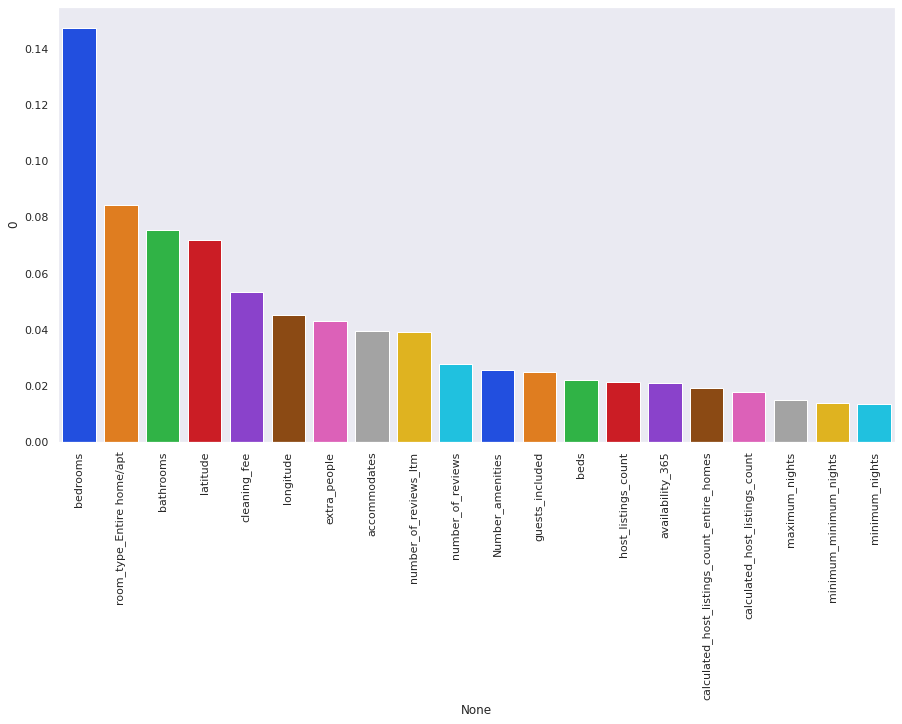

In [260]:
importance_features_top_20 = importance_features.head(20)
importance_features_top_20 = importance_features_top_20.sort_values(by=0,ascending=False)
plt.figure(figsize=(15, 8))  # Ajuste o tamanho da figura conforme necessário
ax = sns.barplot(x=importance_features_top_20.index, y=importance_features_top_20[0],palette='bright')
ax.tick_params(axis='x',rotation=90)

### Conclusion

# The number of bedrooms is the most important feature for the model:
# Room type
# Accommodations with more bathrooms/bedrooms might be more expensive
# Cleaning fee is very important for the final price
# Latitude and longitude are also important for the price, which means location is important